# **MIT 6.S085 Machine Learning for Molecular Design**

## Lecture 5: Inverse-design -- combinatorial optimization and generative modeling

*   We will start at 10:05 am

Lecturer: Wenhao Gao

Date: 2024/01/19

Note: This notebook introduces combinatorial approaches and the deep generative modelings for inverse design using small organic molecules as testbed.


# **Outline**

1. Overview -- inverse design
2. Combinatorial approach
3. Deep generative modeling
4. Outlook -- other methods and modalities
5. Practice

In [ ]:
!pip install rdkit PyTDC wget selfies

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 34.4/34.4 MB 21.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 107.7/107.7 kB 14.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 29.4/29.4 MB 36.4 MB/s eta 0:00:00
  Created wheel for PyTDC: filename=PyTDC-0.4.1-py3-none-any.whl size=140644 sha256=507f2514e87ef113fef266cc47004383920e1a95cbb903772690b00df18b1513
  Stored in directory: /root/.cache/pip/wheels/14/b7/b8/9d9e1442129743359b0507234ccc0beb67b47173faccd57d54
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9655 sha256=fb9c20745b9f4bf56571250abc15271b93ff3d22cf0b113f225ddce9aa14ad94
  Stored in directory: /root/.cache/pip/wheels/8b/f1/7f/5c94f0a7a505ca1c81cd1d9208ae2064675d97582078e6c769
Successfully built PyTDC wget


In [ ]:
from tqdm import trange
from tqdm.auto import tqdm
import random
import os
import yaml
from typing import List, Set
from functools import total_ordering
import numpy as np
import pandas as pd
import joblib
import wget

import rdkit
from rdkit import Chem
from rdkit.Chem.rdchem import Mol
from rdkit.Chem import MolFromSmiles as smi2mol
from rdkit.Chem import MolToSmiles as mol2smi
from rdkit.Chem import AllChem
from rdkit.Chem import Draw
from rdkit.Chem.Draw import IPythonConsole
from rdkit import RDLogger
RDLogger.DisableLog('rdApp.*')
import tdc
from tdc import Oracle
from tdc.generation import MolGen
from tdc import Evaluator
validity_evaluator = Evaluator(name = 'Validity')

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
import torch.nn.functional as F
from torch.nn.utils import clip_grad_norm_
from torch.distributions import Categorical

In [ ]:
wget.download('https://github.com/wenhao-gao/24IAP_ml4moldesign/raw/main/P4/P4.tar.gz')
wget.download('https://github.com/wenhao-gao/mol_opt/raw/main/main/smiles_lstm_hc/pretrained_model/model_final_0.473.pt')
!tar -zxvf P4.tar.gz

./crossover.py
./model_final_0.473.json
./models/
./models/jtvae/
./models/__init__.py
./models/__pycache__/
./models/smiles_vae/
./models/trainer.py
./models/models_storage.py
./models/smiles_vae/misc.py
./models/smiles_vae/config.py
./models/smiles_vae/__init__.py
./models/smiles_vae/__pycache__/
./models/smiles_vae/model.py
./models/smiles_vae/trainer.py
./models/smiles_vae/__pycache__/__init__.cpython-39.pyc
./models/smiles_vae/__pycache__/misc.cpython-39.pyc
./models/smiles_vae/__pycache__/trainer.cpython-39.pyc
./models/smiles_vae/__pycache__/config.cpython-39.pyc
./models/smiles_vae/__pycache__/model.cpython-39.pyc
./models/__pycache__/__init__.cpython-39.pyc
./models/__pycache__/trainer.cpython-39.pyc
./models/jtvae/jtnn_enc.py
./models/jtvae/config.py
./models/jtvae/mol_tree.py
./models/jtvae/jtmpn.py
./models/jtvae/__init__.py
./models/jtvae/mpn.py
./models/jtvae/model.py
./models/jtvae/trainer.py
./models/jtvae/jtnn_dec.py
./mutate.py
./rnn_generator.py
./rnn_utils.py
./smil

In [ ]:
print(f"PyTorch: {torch.__version__}")
print(f"RDKit: {rdkit.__version__}")
print('__CUDNN VERSION:', torch.backends.cudnn.version())
print('__Number CUDA Devices:', torch.cuda.device_count())
print('__CUDA Device Name:',torch.cuda.get_device_name(0))
print('__CUDA Device Total Memory [GB]:',torch.cuda.get_device_properties(0).total_memory/1e9)

PyTorch: 2.1.0+cu121
RDKit: 2023.09.4
__CUDNN VERSION: 8902
__Number CUDA Devices: 1
__CUDA Device Name: Tesla T4
__CUDA Device Total Memory [GB]: 15.835660288


# **Overview -- inverse design**

We have learned how to use predictive modeling to model the structure-property relationship with machine learning. Now we have a mapping from chemical space to property space. Given such a model, we can screen a library.

Like the antibiotic discovery paper: Stokes, Jonathan M., et al. "A deep learning approach to antibiotic discovery." Cell 180.4 (2020): 688-702.

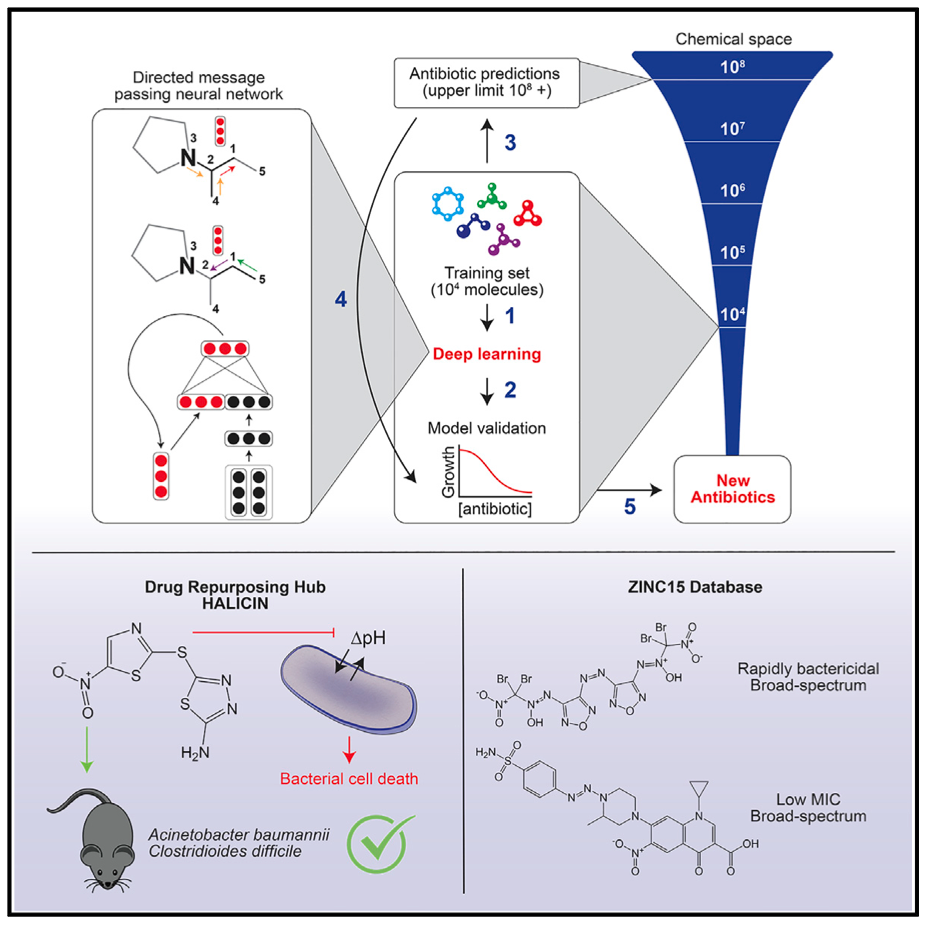

However, chemical space is huge! Even the largest library is still a small fraction of all possible space.

🔵Q: Do you remember how large the druglike chemical space is?

Two problems:

1.   We don't have an exhaustive library.
2.   Even if we can construct an exhaustive library, assume predicting one molecule takes only 1 ms, how much time do we need to screen the whole space?

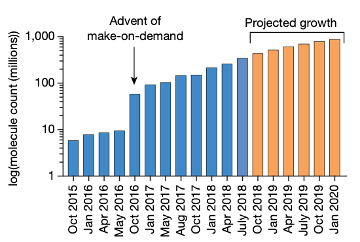

Source: image.png

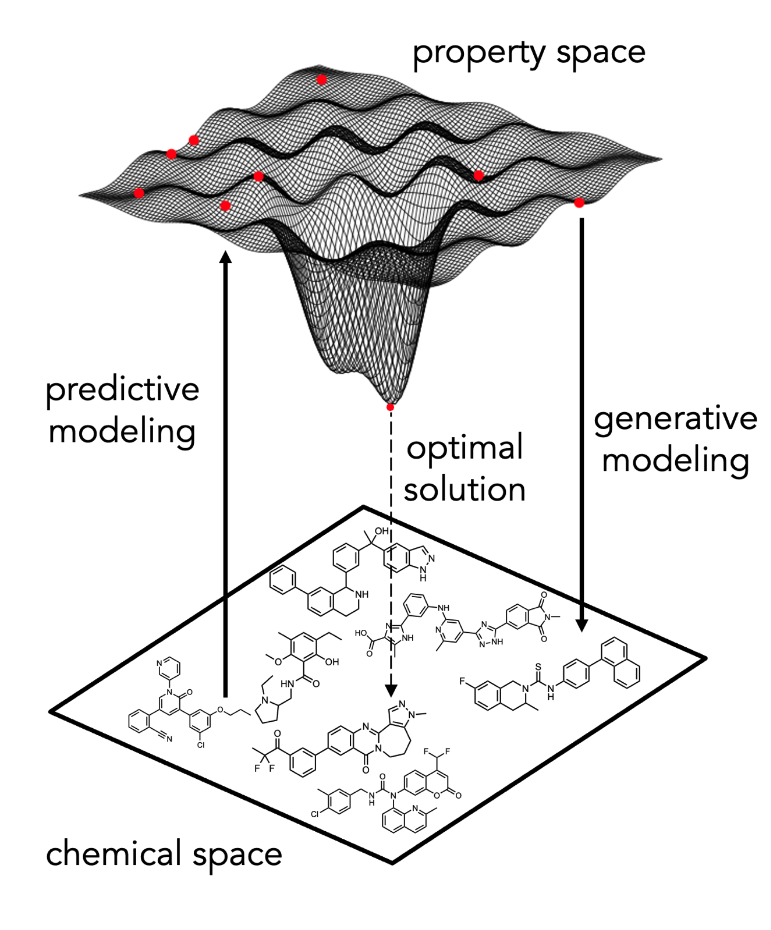

Is there a way we can explore the space more efficiently? Generative modeling!

By generative modeling, we aim to output the molecular structures with desired properties directly, or generate a pool with molecular structures with desired properties enriched, so that we can investigate a smaller number of structures, while keeping the possibility of covering the whole space.

Conceptually, such a workflow is the inverse of predictive modeling, so it's called inverse design.




Defining a set of desired properties is not trivial in practice, but many problems can be roughly abstracted into an constrained optimization problem. Formally, we can formulate such a molecular design problem: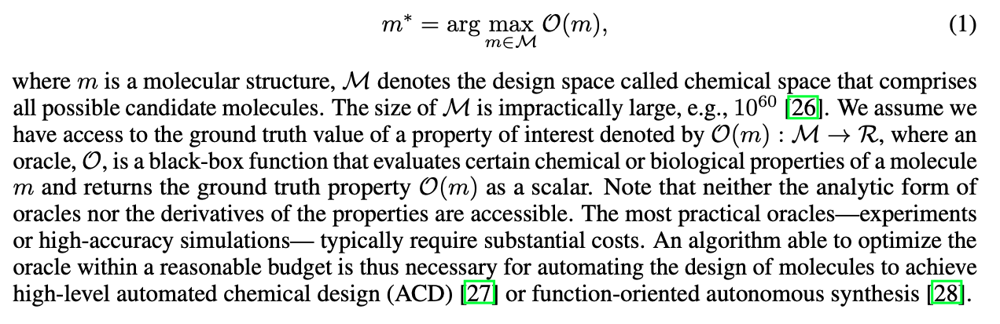

Source: Gao, Wenhao, et al. "Sample efficiency matters: a benchmark for practical molecular optimization." Advances in Neural Information Processing Systems 35 (2022): 21342-21357.

However, the problem is hard. Small organic molecules are highly-structured, discrete and not inherently combinatorial.

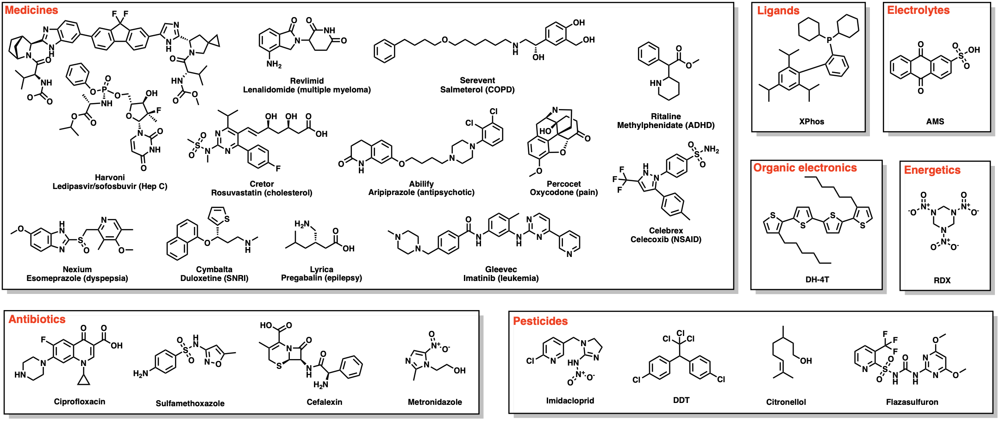

Credit: Connor Coley

Two approaches:

*   Defining some rules, make the chemical space combinatorial -- combinatorial optimization.
*   Smoothing out the discrete nature of chemical compounds, leverage neural networks to predict and sample -- deep generative modeling.



Our test problem : [Glycogen Synthase Kinase 3 Beta (GSK3β)](https://tdcommons.ai/functions/oracles/#glycogen-synthase-kinase-3-beta-gsk3β)

In [ ]:
func = Oracle(name = 'JNK')
func(['CC(C)(C)[C@H]1CCc2c(sc(NC(=O)COc3ccc(Cl)cc3)c2C(N)=O)C1', \
        'CCNC(=O)c1ccc(NC(=O)N2CC[C@H](C)[C@H](O)C2)c(C)c1', \
        'C[C@@H]1CCN(C(=O)CCCc2ccccc2)C[C@@H]1O'])

100%|██████████| 10.9M/10.9M [00:00<00:00, 17.1MiB/s]
Done!


[0.01, 0.0, 0.01]

In [ ]:
zinc = MolGen(name = 'ZINC')
all_smiles = zinc.get_data()['smiles'].tolist()
data = pd.DataFrame({
    'smiles': all_smiles[:1000],
    'score': func(all_smiles[:1000])
})

data

Downloading...
100%|██████████| 11.8M/11.8M [00:00<00:00, 18.6MiB/s]
Loading...
Done!


,smiles,score
0,CC(C)(C)c1ccc2occ(CC(=O)Nc3ccccc3F)c2c1,0.01
1,C[C@@H]1CC(Nc2cncc(-c3nncn3C)c2)C[C@@H](C)C1,0.01
2,N#Cc1ccc(-c2ccc(O[C@@H](C(=O)N3CCCC3)c3ccccc3)...,0.03
3,CCOC(=O)[C@@H]1CCCN(C(=O)c2nc(-c3ccc(C)cc3)n3c...,0.00
4,N#CC1=C(SCC(=O)Nc2cccc(Cl)c2)N=C([O-])[C@H](C#...,0.02
...,...,...
995,ClCCc1nc2cccnc2n1CCn1cccn1,0.00
996,CC[C@@](C)([C@@H]([NH3+])c1cc(Br)ccc1F)N1CCOCC1,0.00
997,Cc1ccc(NC(=O)c2cc3ccccc3oc2=O)c([N+](=O)[O-])c1,0.03
998,CC1(C)OC[C@H]([C@H]2O[C@@H]3OC(C)(C)O[C@@H]3[C...,0.03


In [ ]:
data = data.sort_values(by = 'score', ascending = False)
data = data.reset_index(drop = True)
data

,smiles,score
0,COc1ccc(Br)cc1/C=C1/C(=O)NN(c2ccc(C)c(C)c2)C1=O,0.26
1,COc1ccc([C@@H](C)NC(=O)Cc2cccc3ccccc23)cc1,0.22
2,CNc1ncc(F)c(-c2cccc(Cl)c2)n1,0.18
3,Cc1cccc(COc2ccc(Br)cc2/C=C2\SC(=S)NC2=O)c1,0.14
4,Cc1ccc(/C=C2/SC(=S)N(CCC(=O)N3CCCc4ccccc43)C2=...,0.13
...,...,...
995,CCOc1ccc(F)c(C(=O)OC[C@H]2CCCCO2)c1F,0.00
996,Cc1ccc(N2CC[C@H](C(=O)NC[C@@H](CC(C)C)N3CCOCC3...,0.00
997,CCCNC(=O)CN1CCN(C(=O)Cc2c(C)nn(-c3ccccc3)c2C)CC1,0.00
998,Cc1ccc2c(c1)CCN2C(=O)c1ccc(C)nc1C,0.00


In [ ]:
data[:30].score.mean()

0.11233333333333333

General goal (metrics):

*   Novel
*   Diverse
*   Valid
*   Synthesizable
*   ...

Benchmark: [MOSES](https://www.frontiersin.org/articles/10.3389/fphar.2020.565644/full), [Guacamol](https://pubs.acs.org/doi/10.1021/acs.jcim.8b00839)

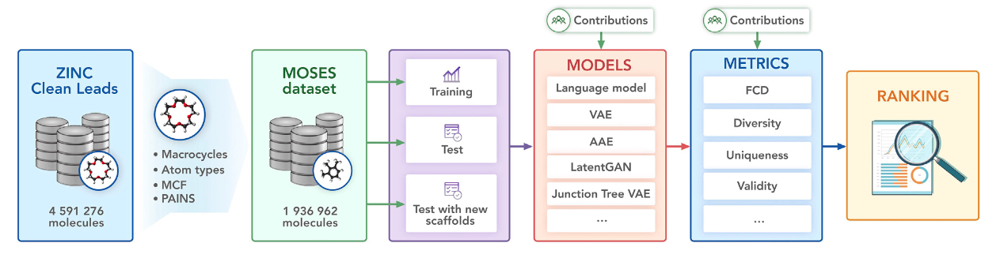

Source: MOSES

Task goal (metrics):

*   Efficient
*   ...

Benchmark: [Guacamol](https://pubs.acs.org/doi/10.1021/acs.jcim.8b00839), [TDC](https://tdcommons.ai/benchmark/docking_group/drd3/), [PMO](https://proceedings.neurips.cc/paper_files/paper/2022/hash/8644353f7d307baaf29bc1e56fe8e0ec-Abstract-Datasets_and_Benchmarks.html)

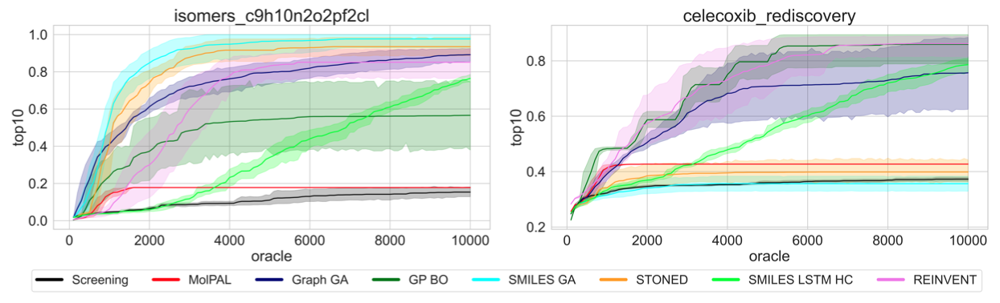

Source: PMO

# **Combinatorial approach**

Combinatorial optimization in chemical space involves defining a set of rules or constraints and then systematically exploring the possible combinations of molecular components within those constraints. This approach is akin to assembling a puzzle where the pieces (molecular components) and the rules for how they can fit together are predefined.

Characteristics:

*   Discrete Nature: A molecular structure is treated as a connection of distinct entities (molecular components).
*   Rule-Based: The exploration is guided by predefined rules or constraints, which can be based on chemical stability, reactivity, or desired properties.
*   Stochastic Search: Depending on the complexity and the constraints, this method can involve an exhaustive search of all possible combinations, often requiring significant computational resources.

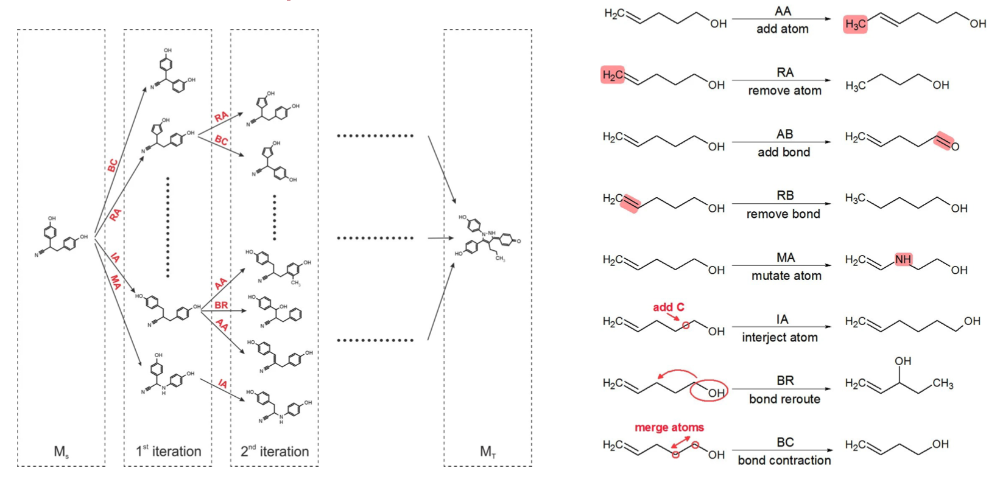

Source: Hoksza, David, et al. "Molpher: a software framework for systematic chemical space exploration." Journal of cheminformatics 6.1 (2014): 1-13.

## Graph GA

Ref: Jensen, Jan H. "A graph-based genetic algorithm and generative model/Monte Carlo tree search for the exploration of chemical space." Chemical science 10.12 (2019): 3567-3572.

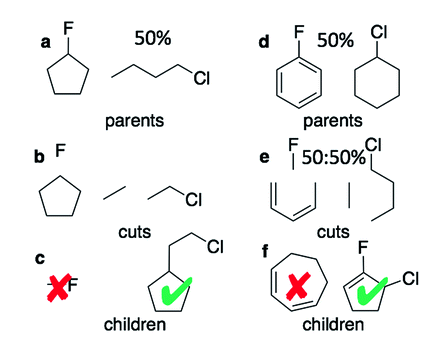

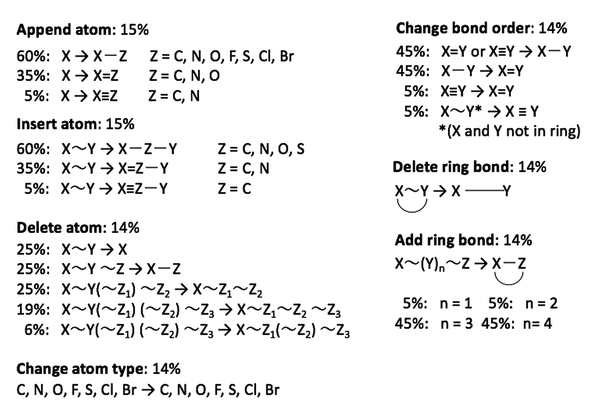

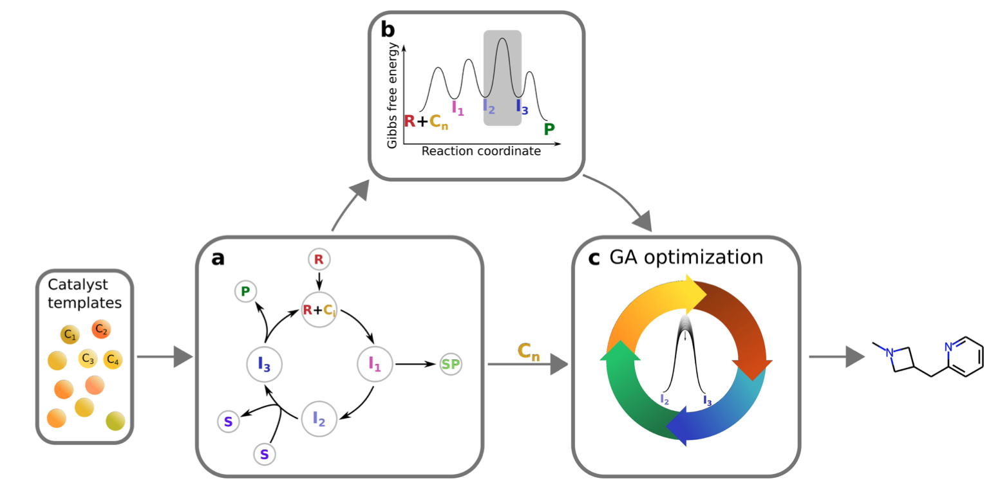

Source: Rasmussen, Maria H., Julius Seumer, and Jan H. Jensen. "Toward De Novo Catalyst Discovery: Fast Identification of New Catalyst Candidates for Alcohol‐Mediated Morita–Baylis–Hillman Reactions." Angewandte Chemie 135.49 (2023): e202310580.

In [ ]:
import crossover as co
import mutate as mu

In [ ]:
MINIMUM = 1e-10

def make_mating_pool(population_mol: List[Mol], population_scores, offspring_size: int):
    """
    Given a population of RDKit Mol and their scores, sample a list of the same size
    with replacement using the population_scores as weights
    Args:
        population_mol: list of RDKit Mol
        population_scores: list of un-normalised scores given by ScoringFunction
        offspring_size: number of molecules to return
    Returns: a list of RDKit Mol (probably not unique)
    """
    # scores -> probs
    population_scores = [s + MINIMUM for s in population_scores]
    sum_scores = sum(population_scores)
    population_probs = [p / sum_scores for p in population_scores]
    mating_pool = np.random.choice(population_mol, p=population_probs, size=offspring_size, replace=True)
    return mating_pool


def reproduce(mating_pool, mutation_rate):
    """
    Args:
        mating_pool: list of RDKit Mol
        mutation_rate: rate of mutation
    Returns:
    """
    parent_a = random.choice(mating_pool)
    parent_b = random.choice(mating_pool)
    new_child = co.crossover(parent_a, parent_b)
    if new_child is not None:
        new_child = mu.mutate(new_child, mutation_rate)
    return new_child

def sanitize(mol_list):
    new_mol_list = []
    smiles_set = set()
    for mol in mol_list:
        if mol is not None:
            try:
                smiles = Chem.MolToSmiles(mol)
                if smiles is not None and smiles not in smiles_set:
                    smiles_set.add(smiles)
                    new_mol_list.append(mol)
            except ValueError:
                print('bad smiles')
    return new_mol_list

In [ ]:
class OracleStorage:
    def __init__(self, args=None, mol_buffer={}):
        self.name = None
        self.evaluator = None
        self.task_label = None
        if args is None:
            self.max_oracle_calls = 10000
            self.freq_log = 100
        else:
            self.args = args
            self.max_oracle_calls = args.max_oracle_calls
            self.freq_log = args.freq_log
        self.mol_buffer = mol_buffer
        self.sa_scorer = tdc.Oracle(name = 'SA')
        self.diversity_evaluator = tdc.Evaluator(name = 'Diversity')
        self.last_log = 0

    @property
    def budget(self):
        return self.max_oracle_calls

    def assign_evaluator(self, evaluator):
        self.evaluator = evaluator

    def sort_buffer(self):
        self.mol_buffer = dict(sorted(self.mol_buffer.items(), key=lambda kv: kv[1][0], reverse=True))

    def save_result(self, suffix=None):

        if suffix is None:
            output_file_path = os.path.join(self.args.output_dir, 'results.yaml')
        else:
            output_file_path = os.path.join(self.args.output_dir, 'results_' + suffix + '.yaml')

        self.sort_buffer()
        with open(output_file_path, 'w') as f:
            yaml.dump(self.mol_buffer, f, sort_keys=False)

    def __len__(self):
        return len(self.mol_buffer)

    def score_smi(self, smi):
        """
        Function to score one molecule

        Argguments:
            smi: One SMILES string represnets a moelcule.

        Return:
            score: a float represents the property of the molecule.
        """
        if len(self.mol_buffer) > self.max_oracle_calls:
            return 0
        if smi is None:
            return 0
        mol = Chem.MolFromSmiles(smi)
        if mol is None or len(smi) == 0:
            return 0
        else:
            smi = Chem.MolToSmiles(mol)
            if smi in self.mol_buffer:
                pass
            else:
                self.mol_buffer[smi] = [float(self.evaluator(smi)), len(self.mol_buffer)+1]
            return self.mol_buffer[smi][0]

    def __call__(self, smiles_lst):
        """
        Score
        """
        if type(smiles_lst) == list:
            score_list = []
            for smi in smiles_lst:
                score_list.append(self.score_smi(smi))
                if len(self.mol_buffer) % self.freq_log == 0 and len(self.mol_buffer) > self.last_log:
                    self.sort_buffer()
                    self.last_log = len(self.mol_buffer)
                    # self.save_result(self.task_label)
        else:  ### a string of SMILES
            score_list = self.score_smi(smiles_lst)
            if len(self.mol_buffer) % self.freq_log == 0 and len(self.mol_buffer) > self.last_log:
                self.sort_buffer()
                self.last_log = len(self.mol_buffer)
                # self.save_result(self.task_label)
        return score_list

    @property
    def finish(self):
        return len(self.mol_buffer) >= self.max_oracle_calls

oracle = OracleStorage()
# oracle = OracleStorage(mol_buffer={data.smiles[i]: (data.score[i], 0) for i in range(len(data))}) # You can initialize oracle with calculated data
oracle.assign_evaluator(func)

In [ ]:
# Takes < 1 min
population_size = 100
num_generations = 10
offspring_size = 100

starting_population = np.random.choice(all_smiles[:1000], population_size)
population_smiles = starting_population
population_mol = [Chem.MolFromSmiles(s) for s in population_smiles]
population_scores = oracle([Chem.MolToSmiles(mol) for mol in population_mol])
pool = joblib.Parallel(n_jobs=8)

patience = 0

for gen in trange(num_generations):

    if len(oracle) > 100:
        oracle.sort_buffer()
        old_score = np.mean([item[1][0] for item in list(oracle.mol_buffer.items())[:30]])
    else:
        old_score = 0

    mating_pool = make_mating_pool(population_mol, population_scores, 200)
    offspring_mol = [reproduce(mating_pool, 0.067) for _ in range(offspring_size)]
    population_mol += offspring_mol
    population_mol = sanitize(population_mol)

    old_scores = population_scores
    population_scores = oracle([Chem.MolToSmiles(mol) for mol in population_mol])
    population_tuples = list(zip(population_scores, population_mol))
    population_tuples = sorted(population_tuples, key=lambda x: x[0], reverse=True)[:population_size]
    population_mol = [t[1] for t in population_tuples]
    population_scores = [t[0] for t in population_tuples]

    if len(oracle) > 100:
        oracle.sort_buffer()
        new_score = np.mean([item[1][0] for item in list(oracle.mol_buffer.items())[:30]])
        print(f"Generation {gen}: {new_score}")
        if (new_score - old_score) < 1e-3:
            patience += 1
            if patience >= 5:
                print('convergence criteria met, abort ...... ')
                break
        else:
            patience = 0

        old_score = new_score

 10%|█         | 1/10 [00:03<00:29,  3.30s/it]

Generation 0: 0.06400000000000002


 20%|██        | 2/10 [00:07<00:30,  3.83s/it]

Generation 1: 0.08866666666666664


 30%|███       | 3/10 [00:10<00:25,  3.58s/it]

Generation 2: 0.115


 40%|████      | 4/10 [00:14<00:20,  3.44s/it]

Generation 3: 0.15433333333333335


 50%|█████     | 5/10 [00:17<00:17,  3.42s/it]

Generation 4: 0.17599999999999996


 60%|██████    | 6/10 [00:21<00:13,  3.50s/it]

Generation 5: 0.1966666666666667


 70%|███████   | 7/10 [00:24<00:10,  3.47s/it]

Generation 6: 0.22066666666666662


 80%|████████  | 8/10 [00:27<00:06,  3.47s/it]

Generation 7: 0.24999999999999997


 90%|█████████ | 9/10 [00:32<00:03,  3.79s/it]

Generation 8: 0.2643333333333334


100%|██████████| 10/10 [00:35<00:00,  3.59s/it]

Generation 9: 0.2806666666666667


In [ ]:
oracle.sort_buffer()
print(f"Final top-30 average score is: {np.mean([item[1][0] for item in list(oracle.mol_buffer.items())[:30]])}")
oracle.mol_buffer

Final top-30 average score is: 0.2806666666666667


{'O=C(Nc1cnccc1NC1=CNN2C=Nc3[nH]ncc3C2=C1CO)c1cc(C2=NC=NC2)c[nH]1': [0.38,
  962],
 'C1=CCC(c2ccncc2-c2cnc3c(c2)CC=N3)C(Nc2nc3c4cn[nH]c4ncn3n2)=C1': [0.33, 793],
 'CSC1=C2c3cn[nH]c3N=CN2CC=C1NC(=O)N[C@@H](O)c1cc(-c2cnccc2Nc2ccccc2)c[nH]1': [0.32,
  817],
 'CC1=C2c3cn[nH]c3N=CN2NC=C1C(C)NC(=O)c1cc(C2=NC=NC2)c[nH]1': [0.32, 845],
 'CSC1=C2c3cn[nH]c3N=CN2CC=C1Nc1ccncc1-c1cnc2c(c1)CC=N2': [0.31, 808],
 'O=C(NC1=CNN2C=Nc3[nH]ncc3C2=C1CO)c1nccc(Br)c1-n1nc(C=CF)[nH]1': [0.31, 908],
 'C1=NCC(c2cnc3c(c2)CC(c2cc(-c4cnccc4Nc4ccccc4)c[nH]2)CN3)=N1': [0.31, 1012],
 'CSC1=C2c3cn[nH]c3N=CN2CC=C1N[C@@H](CO)C1=CC([N+](=O)[O-])C(C2=NC(C=CF)=NC2)C=C1': [0.3,
  929],
 'CSC1=C2c3cn[nH]c3N=CN2CC=C1[C@H](Nc1ccc(-c2ccncc2)cn1)[C@@H](C)CO': [0.29,
  885],
 'C1=Nc2ncc(-c3cc(-c4cnccc4Nc4ccccc4)c[nH]3)cc2C1': [0.29, 896],
 'Nc1[nH]ncc1C1=C(Nc2ccncc2-c2cnc3c(c2)CC=N3)CC2N=CCC2=C1': [0.29, 1026],
 'CSC1=C2c3cn[nH]c3N=CN2CC=C1NC(=O)N[C@@H](CO)C1=CC([N+](=O)[O-])C(c2ccccc2)C=C1': [0.28,
  459],
 'CC1=C2c3cn[nH]c3N=CN

In [ ]:
print(f"Random from ZINC top-30 average score is: {data[:30].score.mean()}")

data

Random from ZINC top-30 average score is: 0.11233333333333333


,smiles,score
0,COc1ccc(Br)cc1/C=C1/C(=O)NN(c2ccc(C)c(C)c2)C1=O,0.26
1,COc1ccc([C@@H](C)NC(=O)Cc2cccc3ccccc23)cc1,0.22
2,CNc1ncc(F)c(-c2cccc(Cl)c2)n1,0.18
3,Cc1cccc(COc2ccc(Br)cc2/C=C2\SC(=S)NC2=O)c1,0.14
4,Cc1ccc(/C=C2/SC(=S)N(CCC(=O)N3CCCc4ccccc43)C2=...,0.13
...,...,...
995,CCOc1ccc(F)c(C(=O)OC[C@H]2CCCCO2)c1F,0.00
996,Cc1ccc(N2CC[C@H](C(=O)NC[C@@H](CC(C)C)N3CCOCC3...,0.00
997,CCCNC(=O)CN1CCN(C(=O)Cc2c(C)nn(-c3ccccc3)c2C)CC1,0.00
998,Cc1ccc2c(c1)CCN2C(=O)c1ccc(C)nc1C,0.00


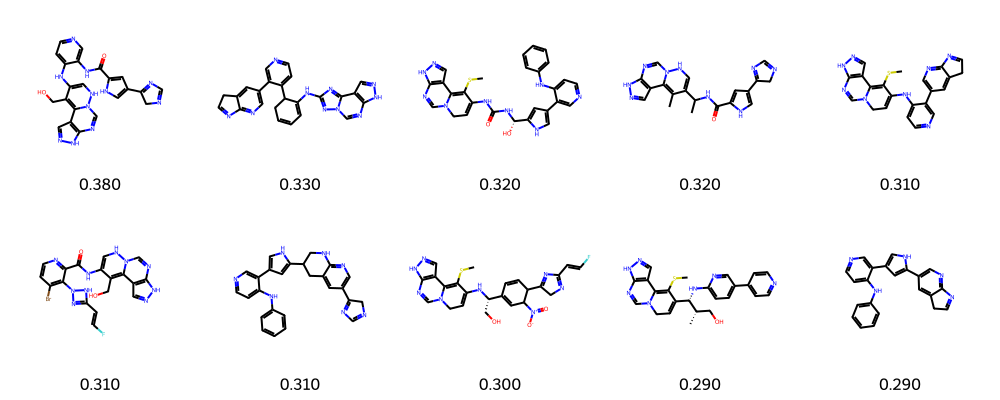

In [ ]:
Draw.MolsToGridImage([Chem.MolFromSmiles(s[0]) for s in list(oracle.mol_buffer.items())[:10]], \
                         molsPerRow=5,subImgSize=(200,200), \
                         legends=[f'{s[1][0]:.3f}' for s in list(oracle.mol_buffer.items())[:10]])

## SEFLIES GA

Ref: Krenn, Mario, et al. "Self-referencing embedded strings (SELFIES): A 100% robust molecular string representation." Machine Learning: Science and Technology 1.4 (2020): 045024.

Ref: Nigam, AkshatKumar, et al. "Beyond generative models: superfast traversal, optimization, novelty, exploration and discovery (STONED) algorithm for molecules using SELFIES." Chemical science 12.20 (2021): 7079-7090.



SELFIES (SELF-referencIng Embedded Strings), another string-based representation that could ensure 100% validity when decode (need to discord invalid part).

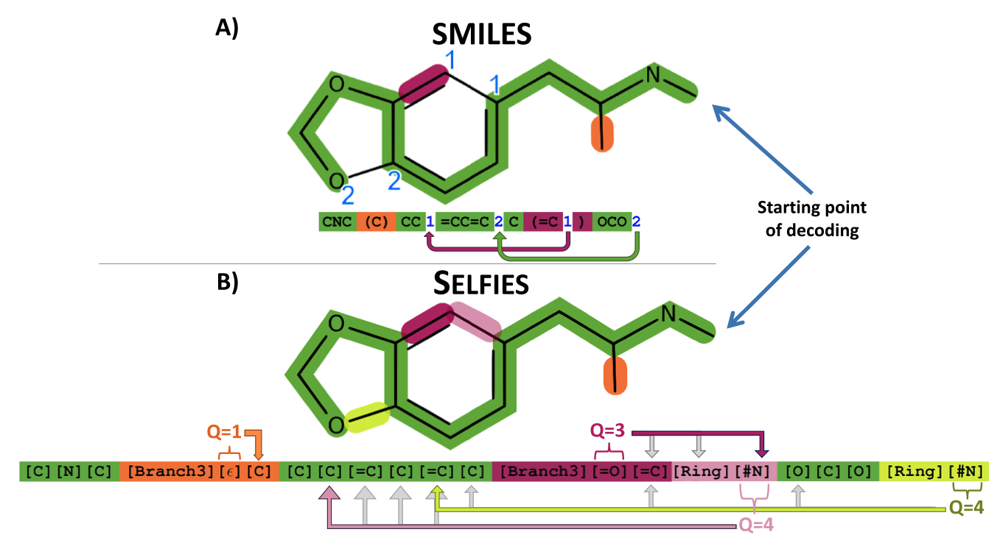

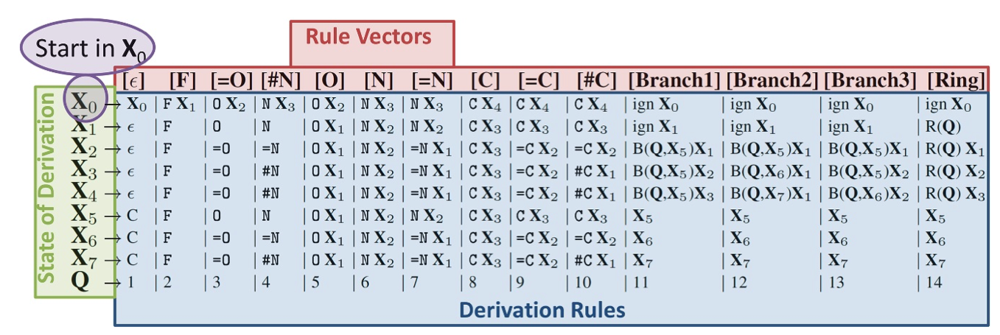

In [ ]:
import selfies
from selfies import encoder, decoder

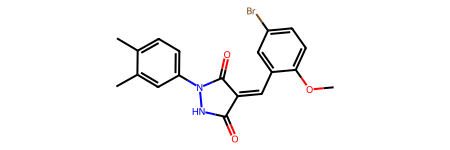

In [ ]:
smiles = "COc1ccc(Br)cc1/C=C1/C(=O)NN(c2ccc(C)c(C)c2)C1=O"
Chem.MolFromSmiles(smiles)

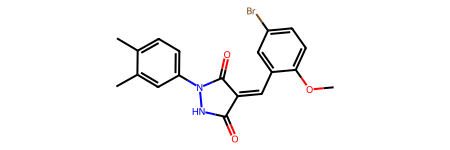

In [ ]:
# Let's change the SMILES a bit
smiles = "COc1ccc(Br)cc1/C=C1/C(=O)NN(c2ccc(C)c(C)c2)C1=O"
Chem.MolFromSmiles(smiles)

In [ ]:
encoder(smiles)

'[C][O][C][=C][C][=C][Branch1][C][Br][C][=C][Ring1][#Branch1][/C][=C][/C][=Branch1][C][=O][N][N][Branch1][#C][C][=C][C][=C][Branch1][C][C][C][Branch1][C][C][=C][Ring1][Branch2][C][Ring1][=C][=O]'

COC1=CC=C(Br)C=C1/C=C/C(=O)NN(C2=CC=C(C)C(C)=C23)C3


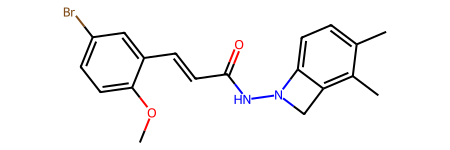

In [ ]:
smiles_decoded = decoder("[C][O][C][=C][C][=C][Branch1][C][Br][C][=C][Ring1][#Branch1][/C][=C][/C][=Branch1][C][=O][N][N][Branch1][#C][C][=C][C][=C][Branch1][C][C][C][Branch1][C][C][=C][Ring1][Branch2][C][Ring1][=O]")
print(smiles_decoded)
Chem.MolFromSmiles(smiles_decoded)

COC=CC=CCBr


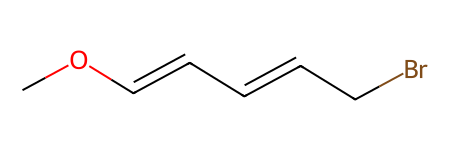

In [ ]:
smiles_decoded = decoder("[C][O][C][=C][C][=C][C][Br][C][=C][Ring1][#Branch1][/C][=C][/C][=Branch1][C][=O][N][N][Branch1][#C][C][=C][C][=C][Branch1][C][C][C][Branch1][C][C][=C][Ring1][Branch2][C][Ring1][=C][=O]")
print(smiles_decoded)
Chem.MolFromSmiles(smiles_decoded)

COC=CC=CCBr


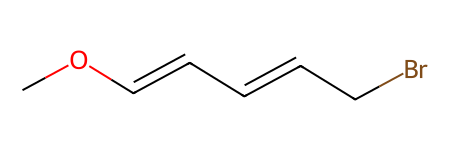

In [ ]:
smiles_decoded = decoder("[C][O][C][=C][C][=C][C][Br]")
print(smiles_decoded)
Chem.MolFromSmiles(smiles_decoded)

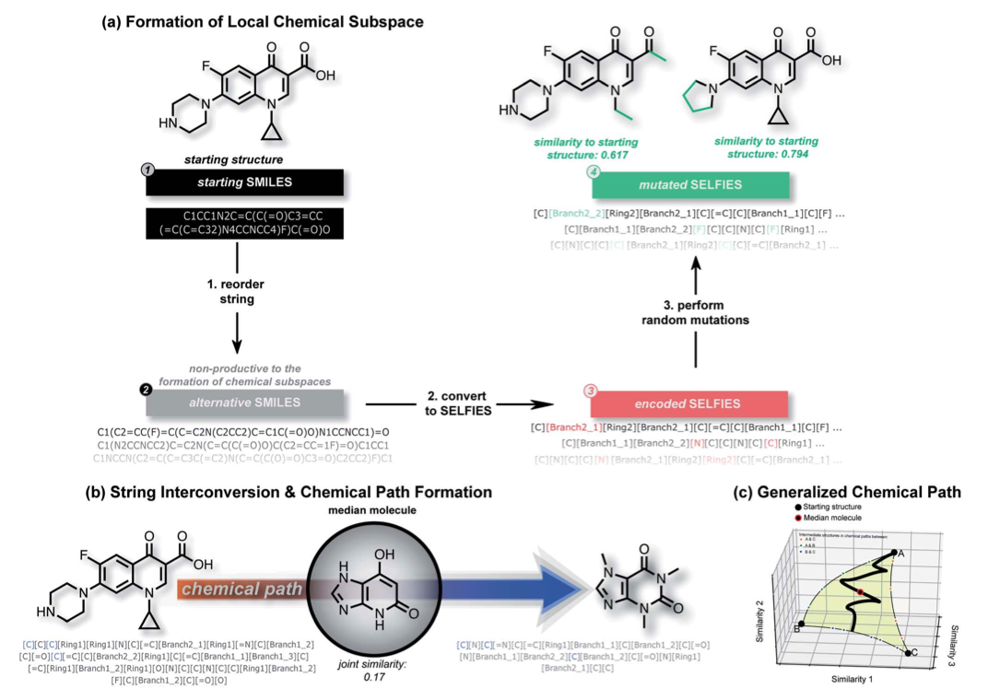

In [ ]:
def get_ECFP4(mol):
    ''' Return rdkit ECFP4 fingerprint object for mol

    Parameters:
    mol (rdkit.Chem.rdchem.Mol) : RdKit mol object

    Returns:
    rdkit ECFP4 fingerprint object for mol
    '''
    return AllChem.GetMorganFingerprint(mol, 2)


def sanitize_smiles(smi):
    '''Return a canonical smile representation of smi

    Parameters:
    smi (string) : smile string to be canonicalized

    Returns:
    mol (rdkit.Chem.rdchem.Mol) : RdKit mol object                          (None if invalid smile string smi)
    smi_canon (string)          : Canonicalized smile representation of smi (None if invalid smile string smi)
    conversion_successful (bool): True/False to indicate if conversion was  successful
    '''
    try:
        mol = smi2mol(smi, sanitize=True)
        smi_canon = mol2smi(mol, isomericSmiles=False, canonical=True)
        return (mol, smi_canon, True)
    except:
        return (None, None, False)


def mutate_selfie(selfie, max_molecules_len, write_fail_cases=False):
    '''Return a mutated selfie string (only one mutation on slefie is performed)

    Mutations are done until a valid molecule is obtained
    Rules of mutation: With a 50% propbabily, either:
        1. Add a random SELFIE character in the string
        2. Replace a random SELFIE character with another

    Parameters:
    selfie            (string)  : SELFIE string to be mutated
    max_molecules_len (int)     : Mutations of SELFIE string are allowed up to this length
    write_fail_cases  (bool)    : If true, failed mutations are recorded in "selfie_failure_cases.txt"

    Returns:
    selfie_mutated    (string)  : Mutated SELFIE string
    smiles_canon      (string)  : canonical smile of mutated SELFIE string
    '''
    valid=False
    fail_counter = 0
    chars_selfie = get_selfie_chars(selfie)

    while not valid:
        fail_counter += 1

        alphabet = list(selfies.get_semantic_robust_alphabet()) # 34 SELFIE characters

        choice_ls = [1, 2] # 1=Insert; 2=Replace; 3=Delete
        random_choice = np.random.choice(choice_ls, 1)[0]

        # Insert a character in a Random Location
        if random_choice == 1:
            random_index = np.random.randint(len(chars_selfie)+1)
            random_character = np.random.choice(alphabet, size=1)[0]

            selfie_mutated_chars = chars_selfie[:random_index] + [random_character] + chars_selfie[random_index:]

        # Replace a random character
        elif random_choice == 2:
            random_index = np.random.randint(len(chars_selfie))
            random_character = np.random.choice(alphabet, size=1)[0]
            if random_index == 0:
                selfie_mutated_chars = [random_character] + chars_selfie[random_index+1:]
            else:
                selfie_mutated_chars = chars_selfie[:random_index] + [random_character] + chars_selfie[random_index+1:]

        # Delete a random character
        elif random_choice == 3:
            random_index = np.random.randint(len(chars_selfie))
            if random_index == 0:
                selfie_mutated_chars = chars_selfie[random_index+1:]
            else:
                selfie_mutated_chars = chars_selfie[:random_index] + chars_selfie[random_index+1:]

        else:
            raise Exception('Invalid Operation trying to be performed')

        selfie_mutated = "".join(x for x in selfie_mutated_chars)
        sf = "".join(x for x in chars_selfie)

        try:
            smiles = decoder(selfie_mutated)
            mol, smiles_canon, done = sanitize_smiles(smiles)
            if len(selfie_mutated_chars) > max_molecules_len or smiles_canon=="":
                done = False
            if done:
                valid = True
            else:
                valid = False
        except:
            valid=False
            if fail_counter > 1 and write_fail_cases == True:
                f = open("selfie_failure_cases.txt", "a+")
                f.write('Tried to mutate SELFIE: '+str(sf)+' To Obtain: '+str(selfie_mutated) + '\n')
                f.close()

    return (selfie_mutated, smiles_canon)


def get_selfie_chars(selfie):
    '''Obtain a list of all selfie characters in string selfie

    Parameters:
    selfie (string) : A selfie string - representing a molecule

    Example:
    >>> get_selfie_chars('[C][=C][C][=C][C][=C][Ring1][Branch1_1]')
    ['[C]', '[=C]', '[C]', '[=C]', '[C]', '[=C]', '[Ring1]', '[Branch1_1]']

    Returns:
    chars_selfie: list of selfie characters present in molecule selfie
    '''
    chars_selfie = [] # A list of all SELFIE sybols from string selfie
    while selfie != '':
        chars_selfie.append(selfie[selfie.find('['): selfie.find(']')+1])
        selfie = selfie[selfie.find(']')+1:]
    return chars_selfie

In [ ]:
generation_size = 200
num_generations = 10
offspring_size = 100

oracle = OracleStorage()
oracle.assign_evaluator(func)

population = np.random.choice(all_smiles[:1000], size=generation_size).tolist()
population = [encoder(smi) for smi in population]
len_random_struct = max([len(get_selfie_chars(s)) for s in population])

patience = 0

for gen in trange(num_generations):

    if len(oracle) > 100:
        oracle.sort_buffer()
        old_scores = [item[1][0] for item in list(oracle.mol_buffer.items())[:30]]
    else:
        old_scores = 0

    fitness = oracle([decoder(i) for i in population])

    #    Step 1: Keep the best molecule:  Keep the best member & mutate the rest
    best_idx = np.argmax(fitness)
    best_selfie = population[best_idx]

    #    Step 2: Get mutated selfies
    new_population = []
    for i in range(generation_size-1):
        selfie_mutated, _ = mutate_selfie(best_selfie, len_random_struct, write_fail_cases=True)
        new_population.append(selfie_mutated)
    new_population.append(best_selfie)

    # Define new population for the next generation
    population = new_population[:]

    ### early stopping
    if len(oracle) > 100:
        oracle.sort_buffer()
        new_scores = [item[1][0] for item in list(oracle.mol_buffer.items())[:30]]
        print(f"Generation {gen}: {np.mean(new_scores)}")
        if new_scores == old_scores:
            patience += 1
            if patience >= 5:
                print('convergence criteria met, abort ...... ')
                break
        else:
            patience = 0

        old_scores = new_scores

 10%|█         | 1/10 [00:04<00:38,  4.24s/it]

Generation 0: 0.059000000000000004


 20%|██        | 2/10 [00:08<00:35,  4.38s/it]

Generation 1: 0.1396666666666667


 30%|███       | 3/10 [00:13<00:30,  4.36s/it]

Generation 2: 0.171


 40%|████      | 4/10 [00:17<00:25,  4.26s/it]

Generation 3: 0.19266666666666665


 50%|█████     | 5/10 [00:21<00:20,  4.14s/it]

Generation 4: 0.21933333333333332


 60%|██████    | 6/10 [00:25<00:16,  4.09s/it]

Generation 5: 0.2416666666666667


 70%|███████   | 7/10 [00:29<00:12,  4.12s/it]

Generation 6: 0.2783333333333333


 80%|████████  | 8/10 [00:33<00:08,  4.12s/it]

Generation 7: 0.29833333333333323


 90%|█████████ | 9/10 [00:37<00:04,  4.13s/it]

Generation 8: 0.31700000000000006


100%|██████████| 10/10 [00:40<00:00,  4.10s/it]

Generation 9: 0.32133333333333336


In [ ]:
oracle.sort_buffer()
print(f"Final top-30 average score is: {np.mean([item[1][0] for item in list(oracle.mol_buffer.items())[:30]])}")
oracle.mol_buffer

Final top-30 average score is: 0.32133333333333336


{'C=C1O[N-]OC1=CC=[C-]N1C(=O)NC(=O)/C(=C/C2=CC=[P+]=C=C2[P+]=B[N+]=O)C1=O': [0.34,
  1644],
 'C=C1O[N-]OC1=CC=[C-]N1C(=O)NC(=O)/C(=C/C2=CC=[P+]=C=C2[P+]=B[B-]=O)C1=O': [0.33,
  1233],
 'C=C1O[N-]OC1=CC=[C-]N1C(=O)NC(=O)/C(=C/C2=CC=[P+]=C=C2[P+]=B[BH-]O)C1=O': [0.33,
  1446],
 'C=C1O[N-]OC1=CC=[C-]N1C(=O)NC(=O)/C(=C/C2=CC=[P+]=C=C2[P+]B=B[B-]=O)C1=O': [0.33,
  1498],
 'C=C1O[N-]OC1=CC=[C-]N1C(=O)NC(=O)/C(=C/C2=CC=[P+]=C=C2[P+][B-]=O)C1=O': [0.33,
  1569],
 'C=C1O[N-]OC1=CC=[C-]N1C(=O)NC(=O)/C(=C/C2=CC=[P+]=C=C2[P+]=BC=O)C1=O': [0.32,
  1170],
 'B=C1O[N-]OC1=CC=[C-]N1C(=O)NC(=O)/C(=C/C2=CC=[P+]=C=C2[P+]=BC=O)C1=O': [0.32,
  1353],
 'C=C1O[N-]OC1=CC=[C-]N1C(=O)NC(=O)/C(=C/C2=CC=[P+]=C=C2[P+]=B[O+]O)C1=O': [0.32,
  1363],
 'C=C1O[N-]OC1=CC=[C-]N1C(=O)NC(=O)/C(=C/C2=CC=[P+]=C=C2[P+]=B[B-][P+])C1=O': [0.32,
  1380],
 '[B-]C(=O)B=[P+]C1=C=[P+]=CC=C1/C=C1/C(=O)NC(=O)N([C-]=CC=C2O[N-]OC2=C)C1=O': [0.32,
  1385],
 'C=C1O[N-]OC1=C[S+]=[C-]N1C(=O)NC(=O)/C(=C/C2=CC=[P+]=C=C2[P+]=B[B-]=O)C1=O': [0.3

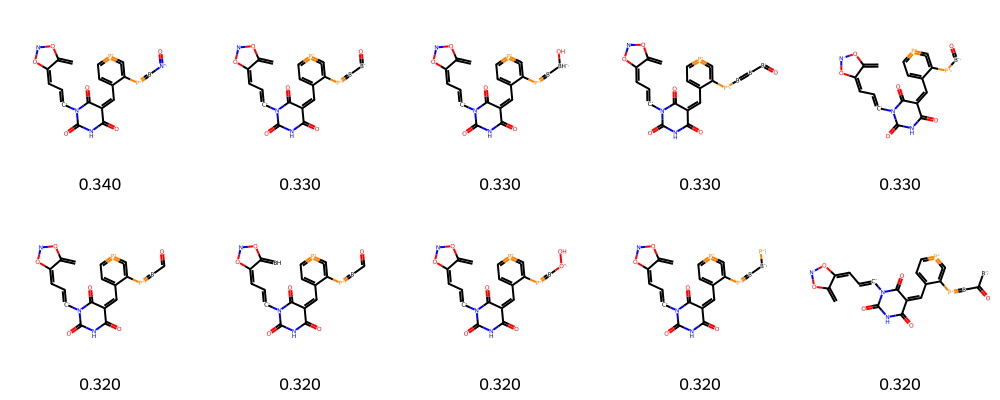

In [ ]:
Draw.MolsToGridImage([Chem.MolFromSmiles(s[0]) for s in list(oracle.mol_buffer.items())[:10]], \
                         molsPerRow=5,subImgSize=(200,200), \
                         legends=[f'{s[1][0]:.3f}' for s in list(oracle.mol_buffer.items())[:10]])

# **Deep Generative modeling**

Nowadays, generative models have achieved significant success in generating images, text, etc. Can we have something like those for molecules?

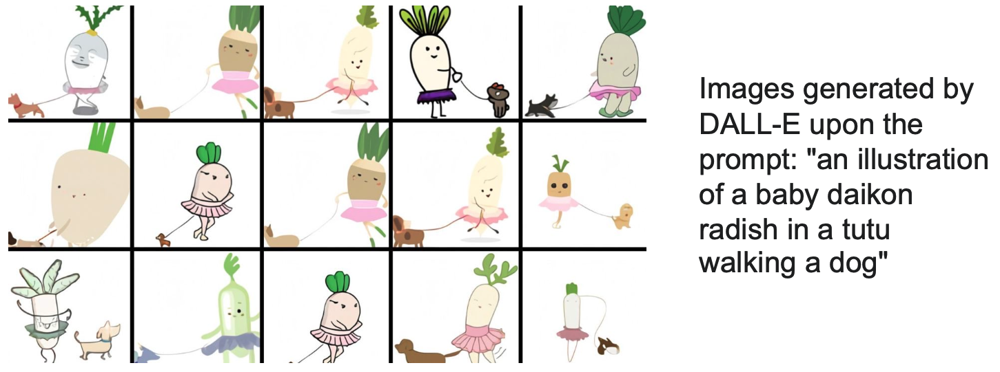

Source: Wiki

First, a brief intro to generative models.

Deep generative modeling, on the other hand, involves using models like Generative Adversarial Networks (GANs) or Variational Autoencoders (VAEs) to generate new molecular structures. This approach doesn't discretely comb through possibilities but rather learns the distribution of molecular structures from the data and samples new structures from this learned distribution.

Characteristics:

*   Data-Driven: The models learn the underlying patterns or distributions in the molecular data, allowing for the generation of novel structures that are similar to, but distinct from, the training data.
*   Continuous Space: The chemical space is treated as a continuum, and the model learns to navigate this space.
*   Efficiency and Novelty: These models can potentially generate novel molecules that are not limited by the combinatorial explosion of possibilities and can do so more efficiently than brute-force methods.

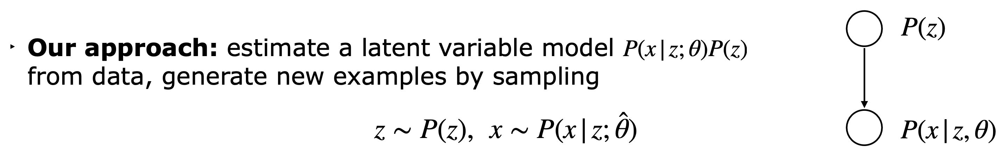

Source: 6.7900

Why? Latent variable models try to identify (specify) some of the underlying choices involved in realizing such objects.

(Source: 6.7900)

## RNN Hill Climbing

Auto-regressive models for modeling sequential data. explicitly learn likelihood of tokens.

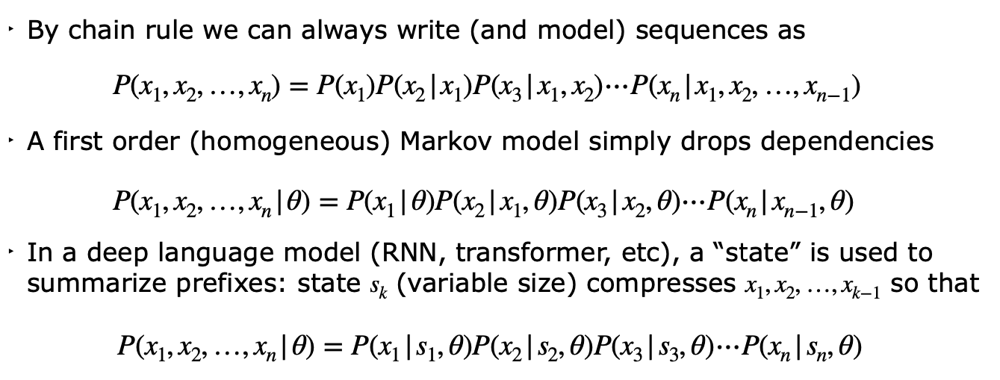

Source: 6.7900

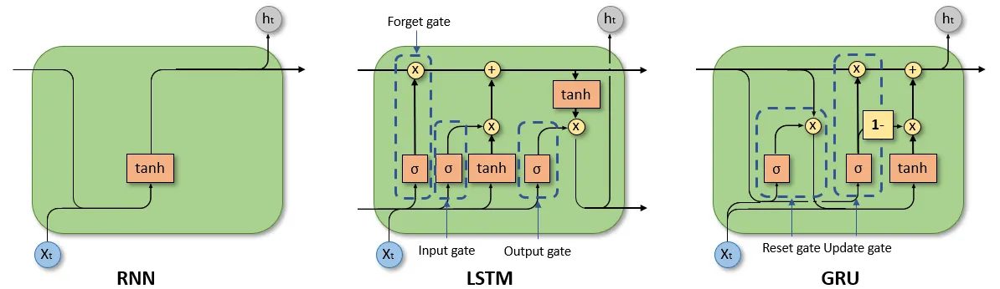

Source: https://towardsdatascience.com/a-brief-introduction-to-recurrent-neural-networks-638f64a61ff4

In [ ]:
class SmilesCharDictionary(object):
    """
    A fixed dictionary for druglike SMILES.
    Enables smile<->token conversion.

    With a space:0 for padding, Q:1 as the start token and end_of_line \n:2 as the stop token.
    """

    PAD = ' '
    BEGIN = 'Q'
    END = '\n'

    def __init__(self) -> None:
        self.forbidden_symbols = {'Ag', 'Al', 'Am', 'Ar', 'At', 'Au', 'D', 'E', 'Fe', 'G', 'K', 'L', 'M', 'Ra', 'Re',
                                  'Rf', 'Rg', 'Rh', 'Ru', 'T', 'U', 'V', 'W', 'Xe',
                                  'Y', 'Zr', 'a', 'd', 'f', 'g', 'h', 'k', 'm', 'si', 't', 'te', 'u', 'v', 'y'}

        self.char_idx = {self.PAD: 0, self.BEGIN: 1, self.END: 2, '#': 20, '%': 22, '(': 25, ')': 24, '+': 26, '-': 27,
                         '.': 30,
                         '0': 32, '1': 31, '2': 34, '3': 33, '4': 36, '5': 35, '6': 38, '7': 37, '8': 40,
                         '9': 39, '=': 41, 'A': 7, 'B': 11, 'C': 19, 'F': 4, 'H': 6, 'I': 5, 'N': 10,
                         'O': 9, 'P': 12, 'S': 13, 'X': 15, 'Y': 14, 'Z': 3, '[': 16, ']': 18,
                         'b': 21, 'c': 8, 'n': 17, 'o': 29, 'p': 23, 's': 28,
                         "@": 42, "R": 43, '/': 44, "\\": 45, 'E': 46
                         }

        self.idx_char = {v: k for k, v in self.char_idx.items()}

        self.encode_dict = {"Br": 'Y', "Cl": 'X', "Si": 'A', 'Se': 'Z', '@@': 'R', 'se': 'E'}
        self.decode_dict = {v: k for k, v in self.encode_dict.items()}

    def allowed(self, smiles) -> bool:
        """
        Determine if smiles string has illegal symbols

        Args:
            smiles: SMILES string

        Returns:
            True if all legal
        """
        for symbol in self.forbidden_symbols:
            if symbol in smiles:
                print('Forbidden symbol {:<2}  in  {}'.format(symbol, smiles))
                return False
        return True

    def encode(self, smiles: str) -> str:
        """
        Replace multi-char tokens with single tokens in SMILES string.

        Args:
            smiles: SMILES string

        Returns:
            sanitized SMILE string with only single-char tokens
        """

        temp_smiles = smiles
        for symbol, token in self.encode_dict.items():
            temp_smiles = temp_smiles.replace(symbol, token)
        return temp_smiles

    def decode(self, smiles):
        """
        Replace special tokens with their multi-character equivalents.

        Args:
            smiles: SMILES string

        Returns:
            SMILES string with possibly multi-char tokens
        """
        temp_smiles = smiles
        for symbol, token in self.decode_dict.items():
            temp_smiles = temp_smiles.replace(symbol, token)
        return temp_smiles

    def get_char_num(self) -> int:
        """
        Returns:
            number of characters in the alphabet
        """
        return len(self.idx_char)

    @property
    def begin_idx(self) -> int:
        return self.char_idx[self.BEGIN]

    @property
    def end_idx(self) -> int:
        return self.char_idx[self.END]

    @property
    def pad_idx(self) -> int:
        return self.char_idx[self.PAD]

    def matrix_to_smiles(self, array):
        """
        Converts an matrix of indices into their SMILES representations

        Args:
            array: torch tensor of indices, one molecule per row

        Returns: a list of SMILES, without the termination symbol
        """
        smiles_strings = []

        for row in array:
            predicted_chars = []

            for j in row:
                next_char = self.idx_char[j.item()]
                if next_char == self.END:
                    break
                predicted_chars.append(next_char)

            smi = ''.join(predicted_chars)
            smi = self.decode(smi)
            smiles_strings.append(smi)

        return smiles_strings

In [ ]:
# Note the difference
sd = SmilesCharDictionary()
sd.encode("CC=OC"), sd.encode("BrCCCl")

('CC=OC', 'YCCX')

In [ ]:
# Try digitalize a SMILES string
max_len = 100
sequences = np.zeros((1, max_len), dtype=np.int32)
enc_smi = sd.BEGIN + sd.encode("CC=O") + sd.END
for c in range(len(enc_smi)):
    sequences[0, c] = sd.char_idx[enc_smi[c]]

sequences

array([[ 1, 19, 19, 41,  9,  2,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0]], dtype=int32)

In [ ]:
# Transform back
sd.matrix_to_smiles(sequences)

['QCC=O']

In [ ]:
class SmilesRnn(nn.Module):
    def __init__(self, input_size, hidden_size, output_size, n_layers, rnn_dropout) -> None:
        """
            Basic RNN language model for SMILES

        Args:
            input_size: number of input symbols
            hidden_size: number of hidden units
            output_size: number of output symbols
            n_layers: number of hidden layers
            rnn_dropout: recurrent dropout
        """
        super().__init__()
        self.input_size = input_size
        self.hidden_size = hidden_size
        self.output_size = output_size
        self.n_layers = n_layers
        self.rnn_dropout = rnn_dropout

        self.encoder = nn.Embedding(input_size, hidden_size)
        self.decoder = nn.Linear(hidden_size, output_size)

        self.rnn = nn.LSTM(hidden_size, hidden_size, batch_first=True, num_layers=n_layers, dropout=rnn_dropout)
        self.init_weights()

    def init_weights(self):
        # encoder / decoder
        nn.init.xavier_uniform_(self.encoder.weight)

        nn.init.xavier_uniform_(self.decoder.weight)
        nn.init.constant_(self.decoder.bias, 0)

        # RNN
        for name, param in self.rnn.named_parameters():
            if 'weight' in name:
                nn.init.orthogonal_(param)
            elif 'bias' in name:
                nn.init.constant_(param, 0)
                r_gate = param[int(0.25 * len(param)):int(0.5 * len(param))]
                nn.init.constant_(r_gate, 1)

    def forward(self, x, hidden):
        embeds = self.encoder(x)
        output, hidden = self.rnn(embeds, hidden)
        output = self.decoder(output)
        return output, hidden

    def init_hidden(self, bsz, device):
        # LSTM has two hidden states...
        return (torch.zeros(self.n_layers, bsz, self.hidden_size).to(device),
                torch.zeros(self.n_layers, bsz, self.hidden_size).to(device))

    @property
    def config(self):
        return dict(input_size=self.input_size,
                    hidden_size=self.hidden_size,
                    output_size=self.output_size,
                    n_layers=self.n_layers,
                    rnn_dropout=self.rnn_dropout)

In [ ]:
# ~30 s
from rnn_utils import get_tensor_dataset, load_smiles_from_list

training_set = all_smiles[:5000]
max_len = 100
clip_gradients = True
n_epochs = 5
lr = 1e-3

cuda_available = torch.cuda.is_available()
device_str = 'cuda' if cuda_available else 'cpu'
device = torch.device(device_str)

train_seqs, _ = load_smiles_from_list(training_set, max_len)
train_set = get_tensor_dataset(train_seqs)

sd = SmilesCharDictionary()
n_characters = sd.get_char_num()

# build network
smiles_model = SmilesRnn(input_size=n_characters,
                            hidden_size=512,
                            output_size=n_characters,
                            n_layers=3,
                            rnn_dropout=0.25)


smiles_model.to(device)
optimizer = torch.optim.Adam(smiles_model.parameters(), lr=lr)
criterion = torch.nn.CrossEntropyLoss(ignore_index=sd.pad_idx)

for epoch_index in range(1, n_epochs + 1):
    print(f'EPOCH {epoch_index}')

    # shuffle at every epoch
    data_loader = DataLoader(train_set,
                                batch_size=64,
                                shuffle=True,
                                num_workers=1,
                                pin_memory=True)

    for batch_index, batch in enumerate(data_loader):
        # setup model for training
        smiles_model.train()
        smiles_model.zero_grad()

        # forward / backward
        # ship data to device
        inp, tgt = batch
        inp = inp.to(device)
        tgt = tgt.to(device)

        # process data
        batch_size = inp.size(0)
        hidden = smiles_model.init_hidden(inp.size(0), device)
        output, hidden = smiles_model(inp, hidden)
        output = output.view(output.size(0) * output.size(1), -1)
        loss = criterion(output, tgt.view(-1))
        print(f"Epoch: {epoch_index}, Batch: {batch_index}, Loss: {loss}")

        loss.backward()

        # optimize
        if clip_gradients:
            nn.utils.clip_grad_norm_(smiles_model.parameters(), 1.0)
        optimizer.step()


EPOCH 1
Epoch: 1, Batch: 0, Loss: 3.8653128147125244
Epoch: 1, Batch: 1, Loss: 3.48252272605896
Epoch: 1, Batch: 2, Loss: 3.600114345550537
Epoch: 1, Batch: 3, Loss: 3.1761226654052734
Epoch: 1, Batch: 4, Loss: 3.074601650238037
Epoch: 1, Batch: 5, Loss: 2.9059412479400635
Epoch: 1, Batch: 6, Loss: 2.862548351287842
Epoch: 1, Batch: 7, Loss: 2.818232774734497
Epoch: 1, Batch: 8, Loss: 2.8036139011383057
Epoch: 1, Batch: 9, Loss: 2.7529568672180176
Epoch: 1, Batch: 10, Loss: 2.732731819152832
Epoch: 1, Batch: 11, Loss: 2.7281270027160645
Epoch: 1, Batch: 12, Loss: 2.736236572265625
Epoch: 1, Batch: 13, Loss: 2.725203275680542
Epoch: 1, Batch: 14, Loss: 2.703937292098999
Epoch: 1, Batch: 15, Loss: 2.7160799503326416
Epoch: 1, Batch: 16, Loss: 2.6861214637756348
Epoch: 1, Batch: 17, Loss: 2.697211980819702
Epoch: 1, Batch: 18, Loss: 2.669647216796875
Epoch: 1, Batch: 19, Loss: 2.670275926589966
Epoch: 1, Batch: 20, Loss: 2.657609701156616
Epoch: 1, Batch: 21, Loss: 2.6730268001556396
Epoc

In [ ]:
from rnn_utils import rnn_start_token_vector

def sample(model, num_samples=100, max_batch_size=64, max_seq_length=100):
    """
    Sample a sequence from the model.

    Returns: a list of indices
    """
    # Round up division to get the number of batches that are necessary:
    number_batches = (num_samples + max_batch_size - 1) // max_batch_size
    remaining_samples = num_samples
    actions = torch.LongTensor(num_samples, max_seq_length).to(device)

    batch_start = 0

    for i in range(number_batches):
        batch_size = min(max_batch_size, remaining_samples)
        batch_end = batch_start + batch_size

        # actions[batch_start:batch_end, :] = self._sample_batch(model, batch_size)

        hidden = model.init_hidden(batch_size, device)

        inp = rnn_start_token_vector(batch_size, device)

        actions_batch = torch.zeros((batch_size, max_seq_length), dtype=torch.long).to(device)

        for char in range(max_seq_length):
            output, hidden = model(inp, hidden)

            prob = F.softmax(output, dim=2)
            distribution = Categorical(probs=prob)
            action = distribution.sample()

            actions_batch[:, char] = action.squeeze()

            inp = action

        actions[batch_start:batch_end, :] = actions_batch

        batch_start += batch_size
        remaining_samples -= batch_size

    return actions

model = smiles_model

model.eval()
with torch.no_grad():
    indices = sample(model, num_samples=10)
results = sd.matrix_to_smiles(indices)

results

['CCOc1cc([C@@H](C)C(=O)CN(Cc2ccccc3C(C)([N-])C(=O)[O-]2)cc12',
 'C[C@@H]1c1ccc(NC(=O)Nc2ccc(n(C)c4c4c(C)nn2)nn2C',
 'O[C@@H](c2cccc2)c1',
 'CN(CCC)NC(=O)c1ccc2c(F)cc(OC)cn1=O)C1',
 'CCc1cc(Cl)cc(NC(=O)CCN2C[C@@H]2CCOCC2)no(=O)c(C)c1',
 'CC[C@@H](NC(=O)c1cccn(F)c1)c1nncn(Cl)cc1',
 '[C@H](C(=O)N1[C@@H]([NH+](C[C@@H](C)Sc3ccccc43)n2)c1',
 'CCC[C@H](C)C(=O)NCn1cccn2c(c1)N[C@@H]1CC=N(NC(Br)=O)NC1',
 'CCN(C(=O)NC(=O)N[C@@H](C)CNC(=O)No1c2ncc(F)ccc11',
 'CC(C)(=O)c1ccc(C(=O)NC2C(=O)c2ccc(c2)ON(C)CO)cc1-C1CCCCC1']

In [ ]:
validity_evaluator(results)

0.0

In [ ]:
from rnn_utils import load_rnn_model

pretrained_model_path = 'model_final_0.473.pt'
model_def = 'model_final_0.473.json'
smiles_model_pretrained = load_rnn_model(model_def, pretrained_model_path, device, copy_to_cpu=True)

In [ ]:
model = smiles_model_pretrained

model.eval()
with torch.no_grad():
    indices = sample(model, num_samples=10)
results = sd.matrix_to_smiles(indices)

results, validity_evaluator(results)

(['N#Cc1ccc(-c2cc(C(F)(F)F)n3nc(C(=O)O)cc3n2)cc1',
  'COc1ccc(-c2noc(CNC(=O)c3cncc(Br)c3)n2)cc1OC',
  'COc1ccc(-c2csc(NN=C3CCN(Cc4ccccc4)CC3)n2)cc1',
  'COc1ccc([N+](=O)[O-])cc1CSc1nc2cc(N3C(=O)c4ccccc4C3=O)c(F)cc2[nH]1',
  'CC(=O)OC1CC(C)C(O)(c2ccccc2)C=C(C)CCC(=O)C(O)C(C)=CC(C)=CC1C',
  'CNC(=O)C(=O)CCCCCCC(=O)Nc1nnc(CCCCC(C)C)s1',
  'O=C(NNc1ncnc2sc3c(c12)CCC3)c1cccc(Br)c1',
  'CCc1ccc(NC(=O)CCS(=O)(=O)c2cccc3nsnc23)cc1',
  'C=CCN1C(=O)C(C)(C)COc2ccc([N+](=O)[O-])cc21',
  'CCCCCC(=O)NN=Cc1ccc(Br)s1'],
 1.0)

Ok, now we can learn the distribution, but how can we sample molecules iwth high scores?

In [ ]:
from rnn_generator import SmilesRnnMoleculeGenerator
from rnn_utils import load_rnn_model, canonicalize_list, get_tensor_dataset, load_smiles_from_list

population_size = 100
max_len = 100
mols_to_sample = 1024
keep_top = 512
optimize_n_epochs = 2
optimize_batch_size = 256
pretrain_n_epochs = 0
num_iteration = 5

oracle = OracleStorage()
oracle.assign_evaluator(func)

cuda_available = torch.cuda.is_available()
device_str = 'cuda' if cuda_available else 'cpu'
device = torch.device(device_str)

starting_population = np.random.choice(all_smiles[:1000], population_size)

pretrained_model_path = 'model_final_0.473.pt'
model_def = 'model_final_0.473.json'
model = load_rnn_model(model_def, pretrained_model_path, device, copy_to_cpu=True)

generator = SmilesRnnMoleculeGenerator(model=model,max_len=max_len,device=device)

@total_ordering
class OptResult:
    def __init__(self, smiles: str, score: float) -> None:
        self.smiles = smiles
        self.score = score

    def __eq__(self, other):
        return (self.score, self.smiles) == (other.score, other.smiles)

    def __lt__(self, other):
        return (self.score, self.smiles) < (other.score, other.smiles)

int_results = generator.pretrain_on_initial_population(oracle, starting_population,
                                                    pretrain_epochs=pretrain_n_epochs,)

results: List[OptResult] = []
seen: Set[str] = set()

for k in int_results:
    if k.smiles not in seen:
        results.append(k)
        seen.add(k.smiles)

for gen in trange(num_iteration):

    if len(oracle) > 50:
        oracle.sort_buffer()
        old_scores = [item[1][0] for item in list(oracle.mol_buffer.items())[:50]]
    else:
        old_scores = 0

    print(f"Iteration: {gen}, Score: {np.mean(old_scores)}")
    samples = generator.sampler.sample(generator.model, mols_to_sample, max_seq_len=generator.max_len)

    canonicalized_samples = set(canonicalize_list(samples, include_stereocenters=True))
    payload = list(canonicalized_samples.difference(seen))
    payload.sort()  # necessary for reproducibility between different runs
    seen.update(canonicalized_samples)
    scores = oracle(payload)

    int_results = [OptResult(smiles=smiles, score=score) for smiles, score in zip(payload, scores)]

    results.extend(sorted(int_results, reverse=True)[0:keep_top])
    results.sort(reverse=True)
    subset = [i.smiles for i in results][0:keep_top]

    np.random.shuffle(subset)

    sub_train = subset[0:int(3 * len(subset) / 4)]
    sub_test = subset[int(3 * len(subset) / 4):]

    train_seqs, _ = load_smiles_from_list(sub_train, max_len=generator.max_len)
    valid_seqs, _ = load_smiles_from_list(sub_test, max_len=generator.max_len)

    train_set = get_tensor_dataset(train_seqs)
    valid_set = get_tensor_dataset(valid_seqs)

    opt_batch_size = min(len(sub_train), optimize_batch_size)

    print_every = int(len(sub_train) / opt_batch_size)

    generator.trainer.fit(train_set, valid_set,
                        n_epochs=optimize_n_epochs,
                        batch_size=opt_batch_size,
                        print_every=print_every,
                        valid_every=print_every)

Some entries for the start population are invalid or duplicated
finetuning with 95 molecules for 0 epochs
VALID | FINAL_MODEL | elapsed: 0:00:00 | molecules: 0 | valid_loss: 13.9914
([], [13.991397221883139])


  0%|          | 0/5 [00:00<?, ?it/s]

Iteration: 0, Score: 0.0506
EPOCH 1
VALID | elapsed: 0:00:01 | epoch: 1/2 (33.3%) | molecules: 256 | valid_loss: 9.2452

TRAIN | elapsed: 0:00:01 | epoch|batch : 1|1 (50.0%) | molecules: 384 | mols/sec: 266.78 | train_loss: 10.4312
VALID | elapsed: 0:00:02 | epoch: 1/2 (50.0%) | molecules: 384 | valid_loss: 7.7570

EPOCH 2
VALID | elapsed: 0:00:03 | epoch: 2/2 (83.3%) | molecules: 640 | valid_loss: 6.1538

TRAIN | elapsed: 0:00:03 | epoch|batch : 2|1 (100.0%) | molecules: 768 | mols/sec: 280.14 | train_loss: 6.9887
VALID | elapsed: 0:00:04 | epoch: 2/2 (100.0%) | molecules: 768 | valid_loss: 4.8818



 20%|██        | 1/5 [00:31<02:07, 31.81s/it]

VALID | FINAL_MODEL | elapsed: 0:00:04 | molecules: 768 | valid_loss: 4.8818
Iteration: 1, Score: 0.20800000000000005
EPOCH 1
VALID | elapsed: 0:00:01 | epoch: 1/2 (33.3%) | molecules: 256 | valid_loss: 3.4406

TRAIN | elapsed: 0:00:01 | epoch|batch : 1|1 (50.0%) | molecules: 384 | mols/sec: 271.20 | train_loss: 4.1675
VALID | elapsed: 0:00:02 | epoch: 1/2 (50.0%) | molecules: 384 | valid_loss: 2.4724

EPOCH 2
VALID | elapsed: 0:00:03 | epoch: 2/2 (83.3%) | molecules: 640 | valid_loss: 1.5606

TRAIN | elapsed: 0:00:03 | epoch|batch : 2|1 (100.0%) | molecules: 768 | mols/sec: 279.23 | train_loss: 2.1212
VALID | elapsed: 0:00:04 | epoch: 2/2 (100.0%) | molecules: 768 | valid_loss: 1.0057



 40%|████      | 2/5 [01:03<01:34, 31.56s/it]

VALID | FINAL_MODEL | elapsed: 0:00:04 | molecules: 768 | valid_loss: 1.0057
Iteration: 2, Score: 0.29159999999999997
EPOCH 1
VALID | elapsed: 0:00:01 | epoch: 1/2 (33.4%) | molecules: 256 | valid_loss: 0.7455

TRAIN | elapsed: 0:00:01 | epoch|batch : 1|1 (50.0%) | molecules: 383 | mols/sec: 274.28 | train_loss: 0.9304
VALID | elapsed: 0:00:02 | epoch: 1/2 (50.0%) | molecules: 383 | valid_loss: 0.5988

EPOCH 2
VALID | elapsed: 0:00:03 | epoch: 2/2 (83.4%) | molecules: 639 | valid_loss: 0.4993

TRAIN | elapsed: 0:00:03 | epoch|batch : 2|1 (100.0%) | molecules: 766 | mols/sec: 280.18 | train_loss: 0.5891
VALID | elapsed: 0:00:04 | epoch: 2/2 (100.0%) | molecules: 766 | valid_loss: 0.4316



 60%|██████    | 3/5 [01:33<01:01, 30.98s/it]

VALID | FINAL_MODEL | elapsed: 0:00:04 | molecules: 766 | valid_loss: 0.4316
Iteration: 3, Score: 0.3410000000000001


 60%|██████    | 3/5 [01:41<01:07, 33.93s/it]


KeyboardInterrupt: 

In [ ]:
oracle.sort_buffer()
print(f"Final top-30 average score is: {np.mean([item[1][0] for item in list(oracle.mol_buffer.items())[:30]])}")
oracle.mol_buffer

Final top-30 average score is: 0.40366666666666673


{'NCCC(=O)Nc1ccc(OCCCC(=O)NCc2ccc(Nc3nccc(-c4ccc(NC(=O)C5(c6ccccc6)CC5CN)nc4)n3)cc2)cc1': [0.55,
  1082],
 'Cn1cc(-c2cccc3c(=O)cc(N4CCOCC4)oc23)c2ccccc21': [0.52, 1983],
 'CCN(CC)CCNC(=O)c1ccc(Nc2nccc(-c3cnc(N4CCC(F)C4)c(C#N)c3)n2)cn1': [0.52,
  3278],
 'CC(C)(C)C1CCC(Nc2nccc(-c3cc4cnccc4s3)n2)CC1': [0.51, 3186],
 'Cc1cc(-c2ccnc(Nc3ccccn3)n2)cnc1N1CCOCC1': [0.5, 2787],
 'COc1cc(C(=O)NC2CCN(C)CC2)ccc1Nc1ncc(C(F)(F)F)c(Oc2ccc(F)cc2)n1': [0.48,
  1654],
 'CC(C)CCn1c(=O)c(N2CCCCC2)nc2cnc(Nc3ccccc3)nc21': [0.45, 1349],
 'COc1cc(C(=O)NC2CCN(C)CC2)ccc1Nc1ncc(C(F)(F)F)c(Oc2cccc3c2C(=O)N(C)C3)n1': [0.44,
  1655],
 'Cc1[nH]c2ccccc2c1-c1ccnc(Nc2ccc(CCN3CCCC3)cc2)n1': [0.43, 2776],
 'COc1cc(-c2cnn(C)c2)ccc1Nc1ncc2cc[nH]c(=NC3C=CC(CO)CO3)c2n1': [0.41, 1651],
 'CN(C)c1ccc(-c2cc(=O)c3cc(Br)cc(Br)c3o2)cc1': [0.41, 2483],
 'COc1cc2nccc(Oc3ccc(NC(=O)c4ccc(C#N)cc4)cc3)c2cc1OC': [0.41, 2616],
 'Cc1cc(C#N)cc(C)c1Oc1nc(NC2CCN(c3cccc(C(N)=O)c3)CC2)ncc1Cl': [0.4, 2793],
 'CCCn1cc[n+](-c2nccc(Nc3ccc(N4CCOCC4)c

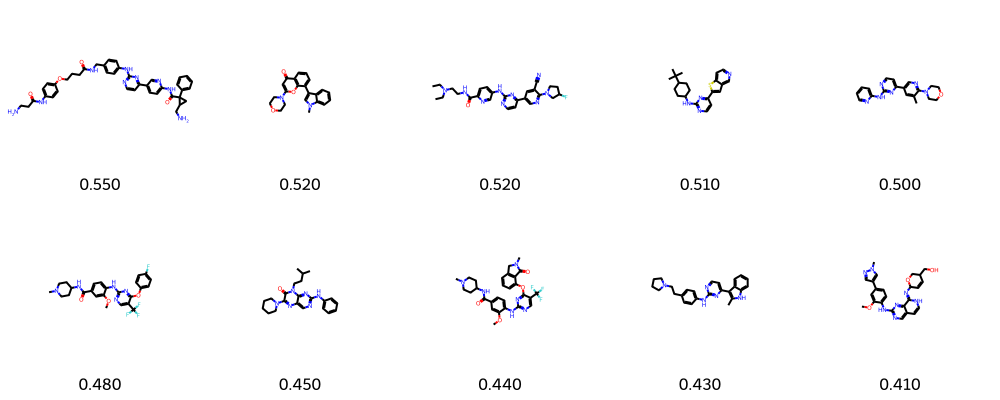

In [ ]:
Draw.MolsToGridImage([Chem.MolFromSmiles(s[0]) for s in list(oracle.mol_buffer.items())[:10]], \
                         molsPerRow=5,subImgSize=(200,200), \
                         legends=[f'{s[1][0]:.3f}' for s in list(oracle.mol_buffer.items())[:10]])

How about SELFIES?

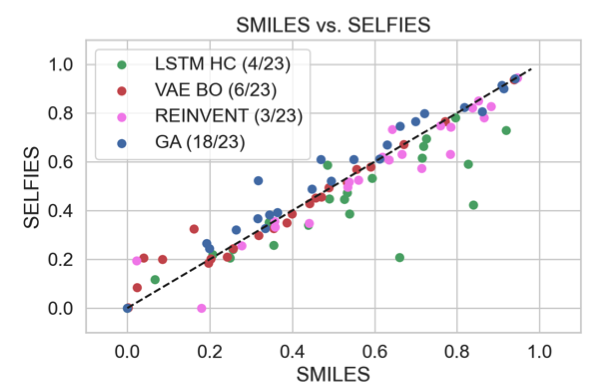

Source: PMO

Other ways to optimize: Reinforcement Learning

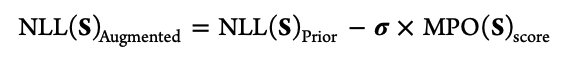

Source: Blaschke, Thomas, et al. "REINVENT 2.0: an AI tool for de novo drug design." Journal of chemical information and modeling 60.12 (2020): 5918-5922.

A nice package from AstraZeneca: [REINVENT4](https://github.com/MolecularAI/REINVENT4)

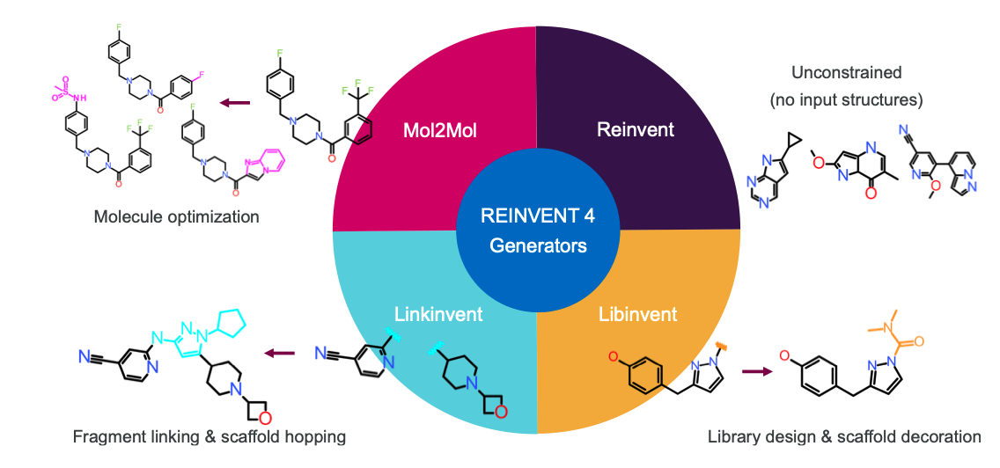

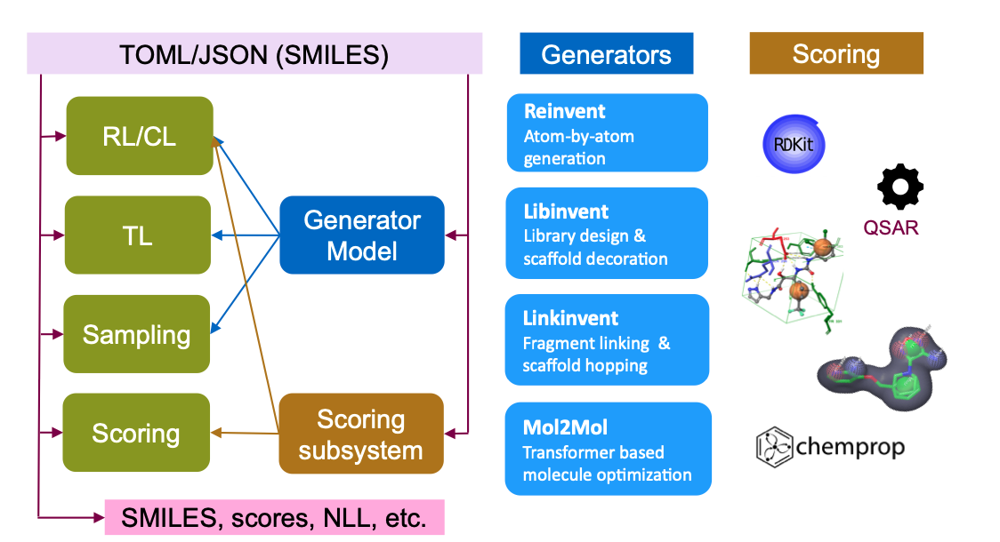

## VAE

VAE is a variant of traditional autoencoder. At its core, a VAE consists of an encoder, a decoder, and a loss function. The encoder transforms input data into a distribution in a latent space, capturing the underlying factors that characterize the data. The decoder part of a VAE aims to reconstruct the input data from the latent space.

Instead of optimizing the log-likelihood, VAE optimize ELBO (Evidence Lower BOund). ELBO provides a computationally tractable way to approximate the log-likelihood of the observed data. Formally, the model is trained to minimize:

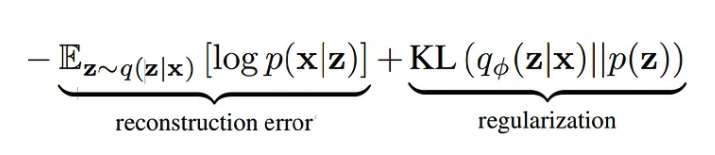

Source: https://towardsdatascience.com/understanding-conditional-variational-autoencoders-cd62b4f57bf8

Ref: Gómez-Bombarelli, Rafael, et al. "Automatic chemical design using a data-driven continuous representation of molecules." ACS central science 4.2 (2018): 268-276.

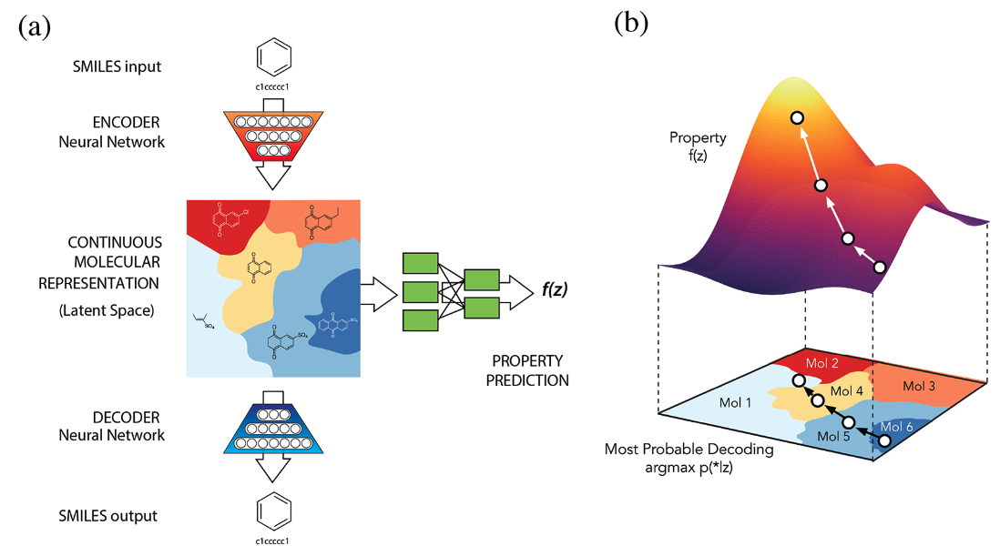

In [ ]:
class VAE(nn.Module):
    def __init__(self, vocab, config):
        super().__init__()

        self.vocabulary = vocab
        # Special symbols
        for ss in ('bos', 'eos', 'unk', 'pad'):
            setattr(self, ss, getattr(vocab, ss))

        # Word embeddings layer
        n_vocab, d_emb = len(vocab), vocab.vectors.size(1)
        self.x_emb = nn.Embedding(n_vocab, d_emb, self.pad)
        self.x_emb.weight.data.copy_(vocab.vectors)
        if config.freeze_embeddings:
            self.x_emb.weight.requires_grad = False

        # Encoder
        if config.q_cell == 'gru':
            self.encoder_rnn = nn.GRU(
                d_emb,
                config.q_d_h,
                num_layers=config.q_n_layers,
                batch_first=True,
                dropout=config.q_dropout if config.q_n_layers > 1 else 0,
                bidirectional=config.q_bidir
            )
        else:
            raise ValueError(
                "Invalid q_cell type, should be one of the ('gru',)"
            )

        q_d_last = config.q_d_h * (2 if config.q_bidir else 1)
        self.q_mu = nn.Linear(q_d_last, config.d_z)
        self.q_logvar = nn.Linear(q_d_last, config.d_z)

        # Decoder
        if config.d_cell == 'gru':
            self.decoder_rnn = nn.GRU(
                d_emb + config.d_z,
                config.d_d_h,
                num_layers=config.d_n_layers,
                batch_first=True,
                dropout=config.d_dropout if config.d_n_layers > 1 else 0
            )
        else:
            raise ValueError(
                "Invalid d_cell type, should be one of the ('gru',)"
            )

        self.decoder_lat = nn.Linear(config.d_z, config.d_d_h)
        self.decoder_fc = nn.Linear(config.d_d_h, n_vocab)

        # Grouping the model's parameters
        self.encoder = nn.ModuleList([
            self.encoder_rnn,
            self.q_mu,
            self.q_logvar
        ])
        self.decoder = nn.ModuleList([
            self.decoder_rnn,
            self.decoder_lat,
            self.decoder_fc
        ])
        self.vae = nn.ModuleList([
            self.x_emb,
            self.encoder,
            self.decoder
        ])

    @property
    def device(self):
        return next(self.parameters()).device

    def string2tensor(self, string, device='model'):
        ids = self.vocabulary.string2ids(string, add_bos=True, add_eos=True)
        tensor = torch.tensor(
            ids, dtype=torch.long,
            device=self.device if device == 'model' else device
        )

        return tensor

    def tensor2string(self, tensor):
        ids = tensor.tolist()
        string = self.vocabulary.ids2string(ids, rem_bos=True, rem_eos=True)

        return string

    def forward(self, x):
        """Do the VAE forward step

        :param x: list of tensors of longs, input sentence x
        :return: float, kl term component of loss
        :return: float, recon component of loss
        """

        # Encoder: x -> z, kl_loss
        z, kl_loss = self.forward_encoder(x)

        # Decoder: x, z -> recon_loss
        recon_loss = self.forward_decoder(x, z)

        return kl_loss, recon_loss

    def forward_encoder(self, x):
        """Encoder step, emulating z ~ E(x) = q_E(z|x)

        :param x: list of tensors of longs, input sentence x
        :return: (n_batch, d_z) of floats, sample of latent vector z
        :return: float, kl term component of loss
        """

        x = [self.x_emb(i_x) for i_x in x]
        x = nn.utils.rnn.pack_sequence(x)

        _, h = self.encoder_rnn(x, None)

        h = h[-(1 + int(self.encoder_rnn.bidirectional)):]
        h = torch.cat(h.split(1), dim=-1).squeeze(0)

        mu, logvar = self.q_mu(h), self.q_logvar(h)
        eps = torch.randn_like(mu)
        z = mu + (logvar / 2).exp() * eps

        kl_loss = 0.5 * (logvar.exp() + mu ** 2 - 1 - logvar).sum(1).mean()

        return z, kl_loss

    def forward_decoder(self, x, z):
        """Decoder step, emulating x ~ G(z)

        :param x: list of tensors of longs, input sentence x
        :param z: (n_batch, d_z) of floats, latent vector z
        :return: float, recon component of loss
        """

        lengths = [len(i_x) for i_x in x]

        x = nn.utils.rnn.pad_sequence(x, batch_first=True,
                                      padding_value=self.pad)
        x_emb = self.x_emb(x)

        z_0 = z.unsqueeze(1).repeat(1, x_emb.size(1), 1)
        x_input = torch.cat([x_emb, z_0], dim=-1)
        x_input = nn.utils.rnn.pack_padded_sequence(x_input, lengths,
                                                    batch_first=True)

        h_0 = self.decoder_lat(z)
        h_0 = h_0.unsqueeze(0).repeat(self.decoder_rnn.num_layers, 1, 1)

        output, _ = self.decoder_rnn(x_input, h_0)

        output, _ = nn.utils.rnn.pad_packed_sequence(output, batch_first=True)
        y = self.decoder_fc(output)

        recon_loss = F.cross_entropy(
            y[:, :-1].contiguous().view(-1, y.size(-1)),
            x[:, 1:].contiguous().view(-1),
            ignore_index=self.pad
        )

        return recon_loss

    def sample_z_prior(self, n_batch):
        """Sampling z ~ p(z) = N(0, I)

        :param n_batch: number of batches
        :return: (n_batch, d_z) of floats, sample of latent z
        """

        return torch.randn(n_batch, self.q_mu.out_features,
                           device=self.x_emb.weight.device)


    def decoder_z(self, z, max_len=100, temp=1.0):
        ### z: (d,)
        n_batch = 2
        z = torch.cat([z,z], dim=0)
        with torch.no_grad():
            z = z.to(self.device)
            z_0 = z.unsqueeze(1)
            # print('decode', z.shape, type(z))

            # Initial values
            h = self.decoder_lat(z)
            # print('decode', h.shape)
            h = h.unsqueeze(0).repeat(self.decoder_rnn.num_layers, 1, 1)
            w = torch.tensor(self.bos, device=self.device).repeat(n_batch)
            x = torch.tensor([self.pad], device=self.device).repeat(n_batch,
                                                                    max_len)
            x[:, 0] = self.bos
            end_pads = torch.tensor([max_len], device=self.device).repeat(
                n_batch)
            eos_mask = torch.zeros(n_batch, dtype=torch.uint8,
                                   device=self.device)
            # print(x.shape, eos_mask.shape)
            # Generating cycle
            for i in range(1, max_len):
                x_emb = self.x_emb(w).unsqueeze(1)
                x_input = torch.cat([x_emb, z_0], dim=-1)

                o, h = self.decoder_rnn(x_input, h)
                y = self.decoder_fc(o.squeeze(1))
                y = F.softmax(y / temp, dim=-1)

                w = torch.multinomial(y, 1)[:, 0]
                # print(x.shape, w.shape, eos_mask.shape, w, eos_mask)
                x[~eos_mask, i] = w[~eos_mask]
                i_eos_mask = ~eos_mask & (w == self.eos)
                end_pads[i_eos_mask] = i + 1
                eos_mask = eos_mask | i_eos_mask
                # print(eos_mask)

            # Converting `x` to list of tensors
            new_x = []
            for i in range(x.size(0)):
                new_x.append(x[i, :end_pads[i]])

            return [self.tensor2string(i_x) for i_x in new_x][0]

    def sample(self, n_batch, max_len=100, z=None, temp=1.0):
        """Generating n_batch samples in eval mode (`z` could be
        not on same device)

        :param n_batch: number of sentences to generate
        :param max_len: max len of samples
        :param z: (n_batch, d_z) of floats, latent vector z or None
        :param temp: temperature of softmax
        :return: list of tensors of strings, samples sequence x
        """
        with torch.no_grad():
            if z is None:
                z = self.sample_z_prior(n_batch)
            z = z.to(self.device)
            # print('sample', z.shape, type(z))
            z_0 = z.unsqueeze(1)

            # Initial values
            h = self.decoder_lat(z)
            # print('sample', h.shape)
            h = h.unsqueeze(0).repeat(self.decoder_rnn.num_layers, 1, 1)
            w = torch.tensor(self.bos, device=self.device).repeat(n_batch)
            x = torch.tensor([self.pad], device=self.device).repeat(n_batch,
                                                                    max_len)
            x[:, 0] = self.bos
            end_pads = torch.tensor([max_len], device=self.device).repeat(
                n_batch)
            eos_mask = torch.zeros(n_batch, dtype=torch.uint8,
                                   device=self.device)
            # print(x.shape, eos_mask.shape)
            # Generating cycle
            for i in range(1, max_len):
                x_emb = self.x_emb(w).unsqueeze(1)
                x_input = torch.cat([x_emb, z_0], dim=-1)

                o, h = self.decoder_rnn(x_input, h)
                y = self.decoder_fc(o.squeeze(1))
                y = F.softmax(y / temp, dim=-1)

                w = torch.multinomial(y, 1)[:, 0]
                # print(x.shape, w.shape, eos_mask.shape, w, eos_mask)
                x[~eos_mask, i] = w[~eos_mask]
                i_eos_mask = ~eos_mask & (w == self.eos)
                end_pads[i_eos_mask] = i + 1
                eos_mask = eos_mask | i_eos_mask

            # Converting `x` to list of tensors
            new_x = []
            for i in range(x.size(0)):
                new_x.append(x[i, :end_pads[i]])

            return [self.tensor2string(i_x) for i_x in new_x]

In [ ]:
# Note the ELBO loss
from vae_utils import set_torch_seed_to_all_gens, OneHotVocab, Logger, CircularBuffer, CosineAnnealingLRWithRestart, KLAnnealer


class VAETrainer():
    def __init__(self, config):
        self.config = config

    def get_vocabulary(self, data):
        if self.config.vocab_load is not None:
            assert os.path.exits(self.config.vocab_load), \
                'vocab_load path does not exist!'
            vocab = torch.load(self.config.vocab_load)
        else:
            vocab = OneHotVocab.from_data(data)
        return vocab

    def save_vocabulary(self, vocab):
        torch.save(vocab, self.config.vocab_save)
        return None

    def get_collate_fn(self, model):
        device = self.get_collate_device(model)

        def collate(data):
            data.sort(key=len, reverse=True)
            tensors = [model.string2tensor(string, device=device)
                       for string in data]

            return tensors

        return collate

    def _train_epoch(self, model, epoch, tqdm_data, kl_weight, optimizer=None):
        if optimizer is None:
            model.eval()
        else:
            model.train()

        kl_loss_values = CircularBuffer(self.config.n_last)
        recon_loss_values = CircularBuffer(self.config.n_last)
        loss_values = CircularBuffer(self.config.n_last)
        for input_batch in tqdm_data:
            input_batch = tuple(data.to(model.device) for data in input_batch)

            # Forward
            kl_loss, recon_loss = model(input_batch)
            loss = kl_weight * kl_loss + recon_loss

            # Backward
            if optimizer is not None:
                optimizer.zero_grad()
                loss.backward()
                clip_grad_norm_(self.get_optim_params(model),
                                self.config.clip_grad)
                optimizer.step()

            # Log
            kl_loss_values.add(kl_loss.item())
            recon_loss_values.add(recon_loss.item())
            loss_values.add(loss.item())
            lr = (optimizer.param_groups[0]['lr']
                  if optimizer is not None
                  else 0)

            # Update tqdm
            kl_loss_value = kl_loss_values.mean()
            recon_loss_value = recon_loss_values.mean()
            loss_value = loss_values.mean()
            postfix = [f'loss={loss_value:.5f}',
                       f'(kl={kl_loss_value:.5f}',
                       f'recon={recon_loss_value:.5f})',
                       f'klw={kl_weight:.5f} lr={lr:.5f}']
            tqdm_data.set_postfix_str(' '.join(postfix))

        postfix = {
            'epoch': epoch,
            'kl_weight': kl_weight,
            'lr': lr,
            'kl_loss': kl_loss_value,
            'recon_loss': recon_loss_value,
            'loss': loss_value,
            'mode': 'Eval' if optimizer is None else 'Train'}

        return postfix

    def get_optim_params(self, model):
        return (p for p in model.vae.parameters() if p.requires_grad)

    def _train(self, model, train_loader, val_loader=None, logger=None):
        device = model.device
        n_epoch = self._n_epoch()
        print(f'Total number of epochs: {n_epoch}')

        optimizer = optim.Adam(self.get_optim_params(model),
                               lr=self.config.lr_start)
        kl_annealer = KLAnnealer(n_epoch, self.config)
        lr_annealer = CosineAnnealingLRWithRestart(optimizer,
                                                   self.config)

        model.zero_grad()
        for epoch in range(n_epoch):
            # Epoch start
            kl_weight = kl_annealer(epoch)
            tqdm_data = tqdm(train_loader,
                             desc='Training (epoch #{})'.format(epoch))
            postfix = self._train_epoch(model, epoch,
                                        tqdm_data, kl_weight, optimizer)
            if logger is not None:
                logger.append(postfix)
                logger.save(self.config.log_file)

            if val_loader is not None:
                tqdm_data = tqdm(val_loader,
                                 desc='Validation (epoch #{})'.format(epoch))
                postfix = self._train_epoch(model, epoch, tqdm_data, kl_weight)
                if logger is not None:
                    logger.append(postfix)
                    logger.save(self.config.log_file)

            if (self.config.model_save is not None) and \
                    (epoch % self.config.save_frequency == 0):
                model = model.to('cpu')
                torch.save(model,
                           self.config.model_save[:-3] +
                           '_{0:03d}.pt'.format(epoch))
                model = model.to(device)

            # Epoch end
            lr_annealer.step()

    def fit(self, model, train_data, val_data=None):
        logger = Logger() if self.config.log_file is not None else None

        train_loader = self.get_dataloader(model, train_data, shuffle=True)
        val_loader = None if val_data is None else self.get_dataloader(
            model, val_data, shuffle=False
        )

        self._train(model, train_loader, val_loader, logger)
        return model

    def _n_epoch(self):
        return sum(
            self.config.lr_n_period * (self.config.lr_n_mult ** i)
            for i in range(self.config.lr_n_restarts)
        )

    @property
    def n_workers(self):
        n_workers = self.config.n_workers
        return n_workers if n_workers != 1 else 0

    def get_collate_device(self, model):
        n_workers = self.n_workers
        return 'cpu' if n_workers > 0 else model.device

    def get_dataloader(self, model, data, collate_fn=None, shuffle=True):
        if collate_fn is None:
            collate_fn = self.get_collate_fn(model)
        return DataLoader(data, batch_size=self.config.n_batch,
                          shuffle=shuffle,
                          num_workers=self.n_workers, collate_fn=collate_fn,
                          worker_init_fn=set_torch_seed_to_all_gens
                          if self.n_workers > 0 else None)


In [ ]:
# ~ 1 min
class Configuration(object):
    def __init__(self, **kwargs):
        self.__dict__.update(kwargs)

config = Configuration()
##### Encoder GRU #####
config.q_cell = 'gru'
config.q_bidir = False
config.q_d_h = 256
config.q_n_layers = 1
config.q_dropout = 0.25
##### Decoder GRU #####
config.d_cell = 'gru'
config.d_n_layers = 5
config.d_dropout = 0
config.d_d_h = 512
config.d_z = 128
config.freeze_embeddings = False
##### Train #####
config.n_batch = 512
config.clip_grad = 50
config.kl_start = 0
config.kl_w_start = 0
config.kl_w_end = 0.05
config.lr_start = 3 * 1e-4
config.lr_n_period = 5 # epoch
config.lr_n_restarts = 1
config.lr_n_mult = 1
config.lr_end = 3 * 1e-4
config.n_last = 1000
config.n_jobs = 1
config.n_workers = 1
##### Others #####
config.config_save = 'smiles_vae_test_config.pt'
config.model_save = 'smiles_vae_test_model.pt'
config.model_load = None
config.vocab_save = 'smiles_vae_test_vocab.txt'
config.vocab_load = None
config.log_file = 'smiles_vae_test_log.txt'
config.save_frequency = 10000
config.data_seed = 42

cuda_available = torch.cuda.is_available()
device_str = 'cuda' if cuda_available else 'cpu'
device = torch.device(device_str)

train_data = all_smiles[:5000]

trainer = VAETrainer(config)
vocab = trainer.get_vocabulary(train_data)
model = VAE(vocab, config).to(device)
trainer.fit(model, train_data)

Total number of epochs: 5


Training (epoch #0):   0%|          | 0/10 [00:00<?, ?it/s]

Training (epoch #1):   0%|          | 0/10 [00:00<?, ?it/s]

Training (epoch #2):   0%|          | 0/10 [00:00<?, ?it/s]

Training (epoch #3):   0%|          | 0/10 [00:00<?, ?it/s]

Training (epoch #4):   0%|          | 0/10 [00:00<?, ?it/s]

VAE(
  (x_emb): Embedding(37, 37, padding_idx=35)
  (encoder_rnn): GRU(37, 256, batch_first=True)
  (q_mu): Linear(in_features=256, out_features=128, bias=True)
  (q_logvar): Linear(in_features=256, out_features=128, bias=True)
  (decoder_rnn): GRU(165, 512, num_layers=5, batch_first=True)
  (decoder_lat): Linear(in_features=128, out_features=512, bias=True)
  (decoder_fc): Linear(in_features=512, out_features=37, bias=True)
  (encoder): ModuleList(
    (0): GRU(37, 256, batch_first=True)
    (1-2): 2 x Linear(in_features=256, out_features=128, bias=True)
  )
  (decoder): ModuleList(
    (0): GRU(165, 512, num_layers=5, batch_first=True)
    (1): Linear(in_features=128, out_features=512, bias=True)
    (2): Linear(in_features=512, out_features=37, bias=True)
  )
  (vae): ModuleList(
    (0): Embedding(37, 37, padding_idx=35)
    (1): ModuleList(
      (0): GRU(37, 256, batch_first=True)
      (1-2): 2 x Linear(in_features=256, out_features=128, bias=True)
    )
    (2): ModuleList(
   

In [ ]:
# Again, here is a pre-trained model
vae_model = torch.load("smiles_vae_model_080.pt")
vae_model.eval()

VAE(
  (x_emb): Embedding(38, 38, padding_idx=36)
  (encoder_rnn): GRU(38, 256, batch_first=True)
  (q_mu): Linear(in_features=256, out_features=128, bias=True)
  (q_logvar): Linear(in_features=256, out_features=128, bias=True)
  (decoder_rnn): GRU(166, 512, num_layers=3, batch_first=True)
  (decoder_lat): Linear(in_features=128, out_features=512, bias=True)
  (decoder_fc): Linear(in_features=512, out_features=38, bias=True)
  (encoder): ModuleList(
    (0): GRU(38, 256, batch_first=True)
    (1-2): 2 x Linear(in_features=256, out_features=128, bias=True)
  )
  (decoder): ModuleList(
    (0): GRU(166, 512, num_layers=3, batch_first=True)
    (1): Linear(in_features=128, out_features=512, bias=True)
    (2): Linear(in_features=512, out_features=38, bias=True)
  )
  (vae): ModuleList(
    (0): Embedding(38, 38, padding_idx=36)
    (1): ModuleList(
      (0): GRU(38, 256, batch_first=True)
      (1-2): 2 x Linear(in_features=256, out_features=128, bias=True)
    )
    (2): ModuleList(
   

In [ ]:
# Let's encode a molecule
smiles = "Cc1ccc(CS(=O)(=O)N2CCCCC2)cc1"
x = vae_model.string2tensor(smiles).unsqueeze(0)
z, _ = vae_model.forward_encoder(x)
z

tensor([[ 2.9295e-02,  6.4067e-01,  5.9645e-01,  1.0634e+00, -4.4630e-01,
         -6.8104e-01,  5.7392e-01,  1.8649e-01,  1.7871e-01,  2.6950e-01,
          1.2742e+00, -1.1795e-03, -3.0487e-01, -9.8406e-01,  1.2037e-01,
          3.5146e-01,  4.6705e-01,  7.2767e-01,  9.1358e-02, -3.8903e-01,
          5.3319e-01,  1.0329e+00, -7.0225e-01,  1.0171e+00,  7.6091e-01,
          1.0954e+00,  3.4296e-01,  7.1622e-01,  4.1344e-01, -5.7130e-01,
          5.0703e-01, -4.7247e-01, -1.1322e+00, -1.3506e-01,  1.6357e+00,
          6.5338e-01,  5.7653e-01, -3.6450e-01, -6.3230e-02,  7.1802e-02,
          9.2455e-01, -3.7623e-01,  1.0327e+00, -6.8524e-01,  6.3389e-01,
          2.1165e-01, -4.9066e-02, -1.4372e+00,  1.4477e+00,  2.7297e-01,
         -2.0637e-01, -7.3740e-01,  1.0800e-01,  1.0393e+00, -4.0140e-01,
         -2.2958e+00,  1.6083e+00, -2.4781e+00, -4.1783e-01, -1.1881e+00,
          8.1616e-01, -2.9922e-01, -3.3331e-01, -9.8182e-01, -3.4359e-01,
          2.8803e-01, -7.3326e-01,  1.

In [ ]:
z.shape

torch.Size([1, 128])

In [ ]:
# And decode
decoded_smi = vae_model.decoder_z(z)
decoded_smi, validity_evaluator([decoded_smi])

('COc1ccc(F)c(NC(=O)[C@H](C)Cn2nc(C)cc2C)c1', 1.0)

In [ ]:
# Note the randomness
seed = 42
torch.manual_seed(seed)

decoded_smi = vae_model.decoder_z(z)
decoded_smi

'Cc1cc(C(=O)NCCc2ccccn2)c2c([C@@H]3CCCO3)nnc2s1'

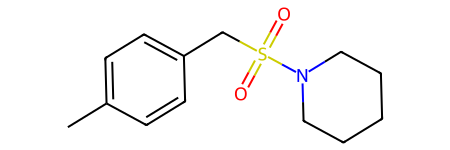

In [ ]:
Chem.MolFromSmiles("Cc1ccc(CS(=O)(=O)N2CCCCC2)cc1")

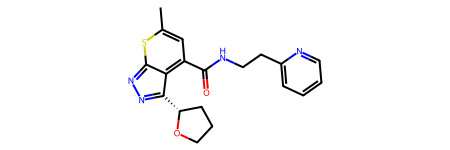

In [ ]:
Chem.MolFromSmiles("Cc1cc(C(=O)NCCc2ccccn2)c2c([C@@H]3CCCO3)nnc2s1")

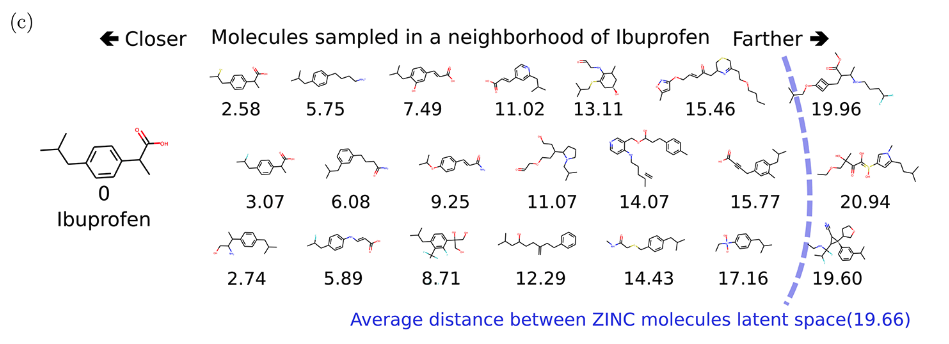

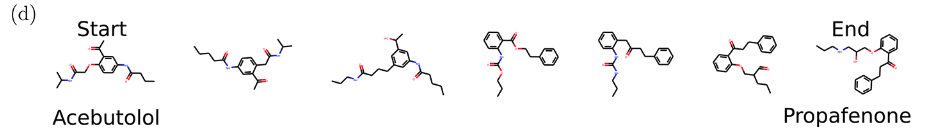

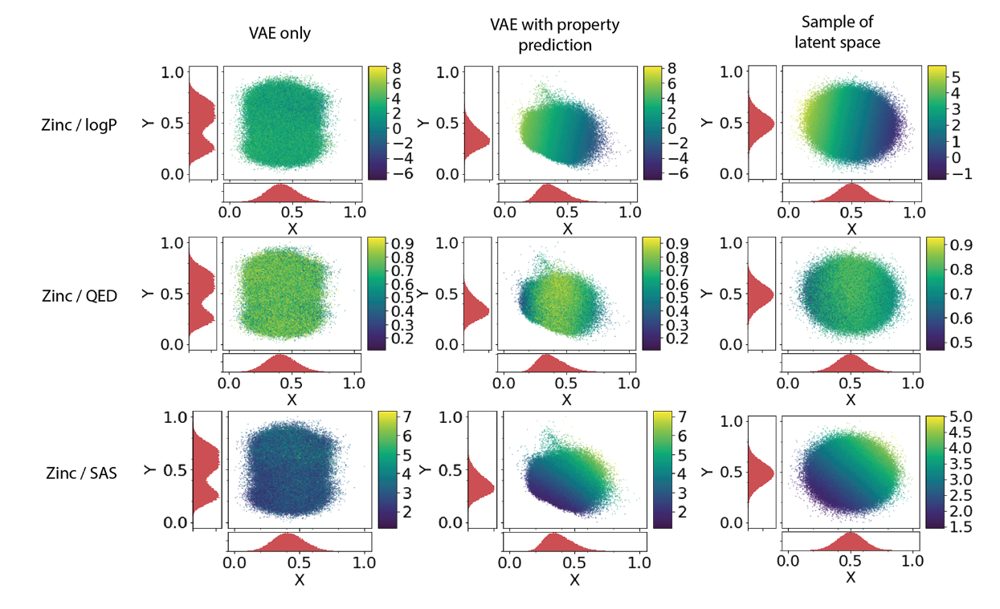

How to optimize? Any numerical optimization methods work now. People use Bayesian optimization a lot.

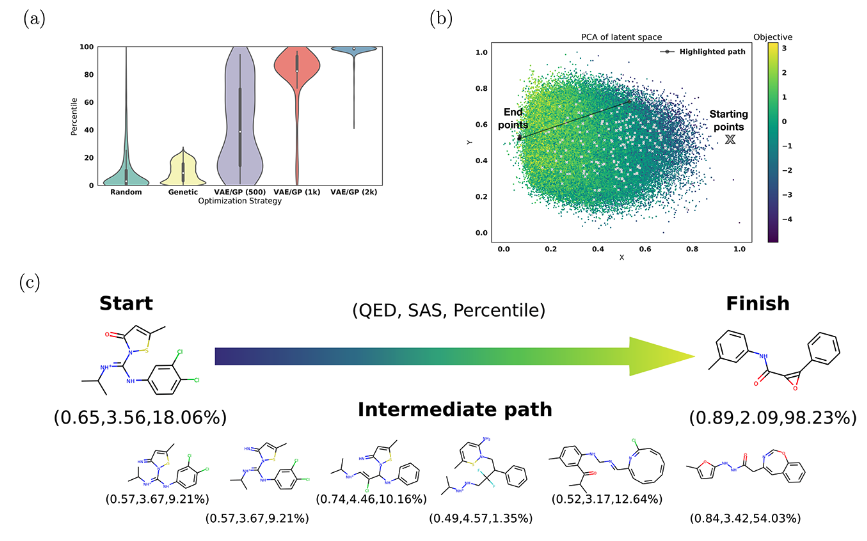

Generative models also can do conditional generation.

Ref: Doersch, Carl. "Tutorial on variational autoencoders." arXiv preprint arXiv:1606.05908 (2016).

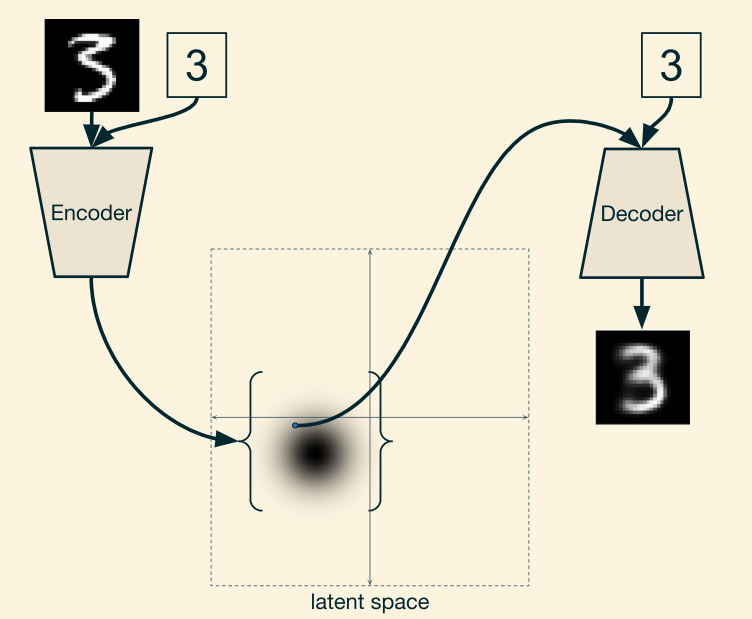

Source: https://ijdykeman.github.io/ml/2016/12/21/cvae.html

In molecules, it also works! But requires labeled data, and hard to go beyond training set.



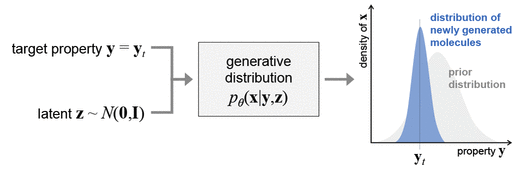

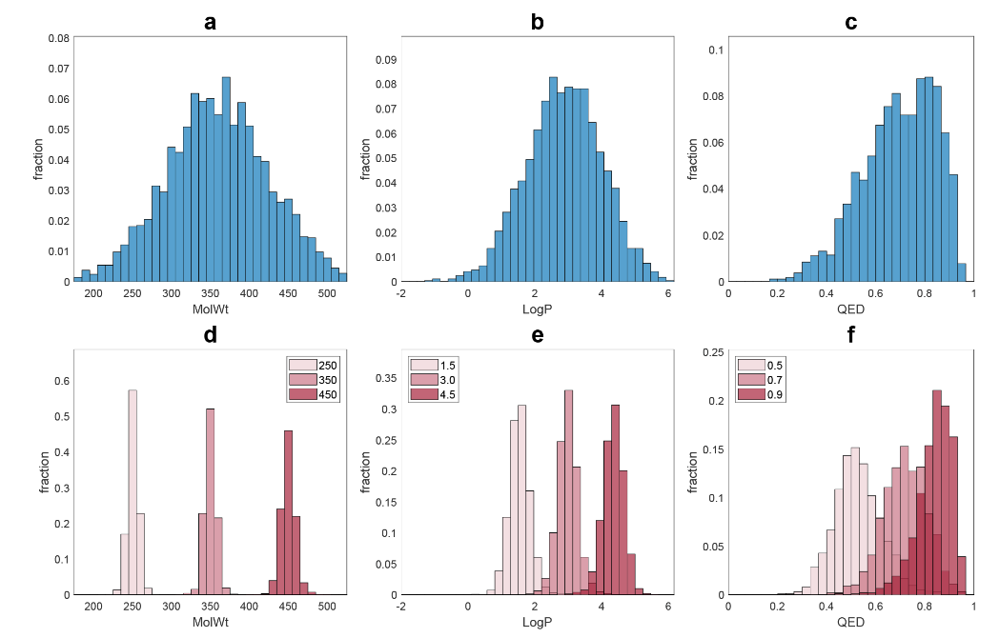

Source: Kang, Seokho, and Kyunghyun Cho. "Conditional molecular design with deep generative models." Journal of chemical information and modeling 59.1 (2018): 43-52.

## Graph generation

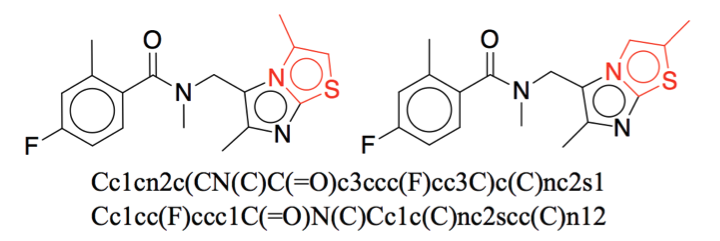

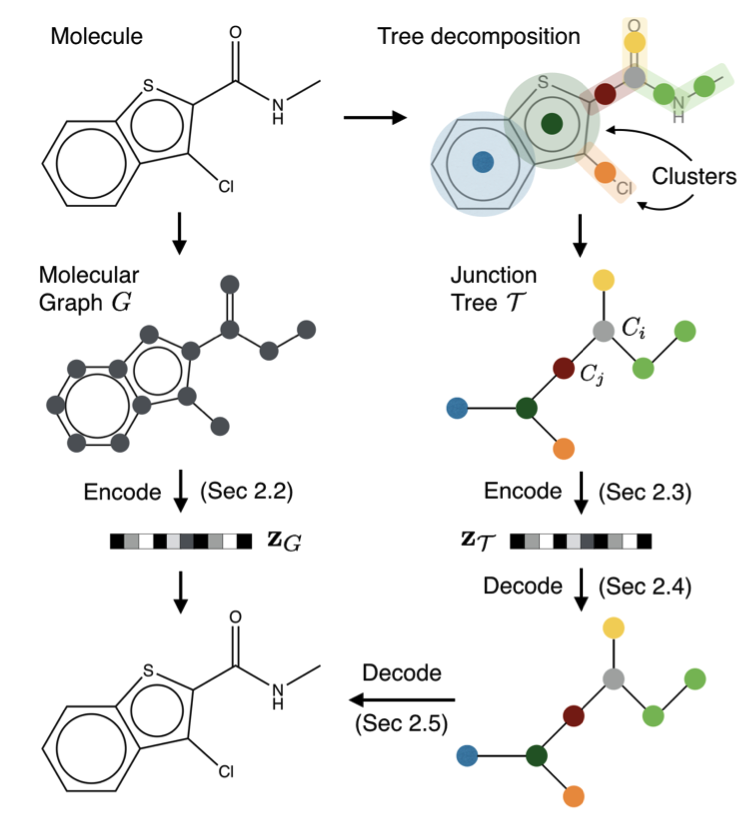

Source: Jin, Wengong, Regina Barzilay, and Tommi Jaakkola. "Junction tree variational autoencoder for molecular graph generation." International conference on machine learning. PMLR, 2018.

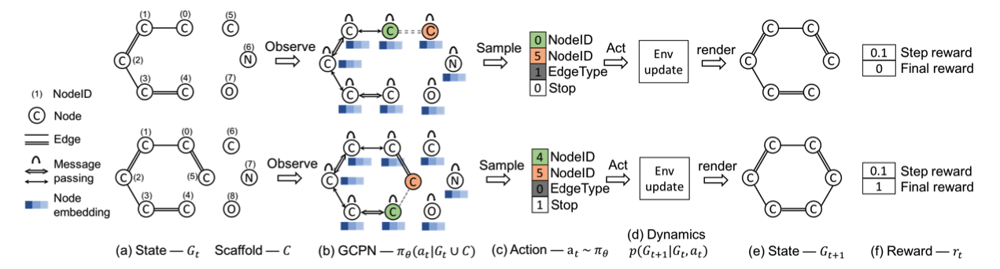

Source: You, Jiaxuan, et al. "Graph convolutional policy network for goal-directed molecular graph generation." Advances in neural information processing systems 31 (2018).

# **Outlook -- other methods and modalities**

What we covered is just a small portion, other methods:

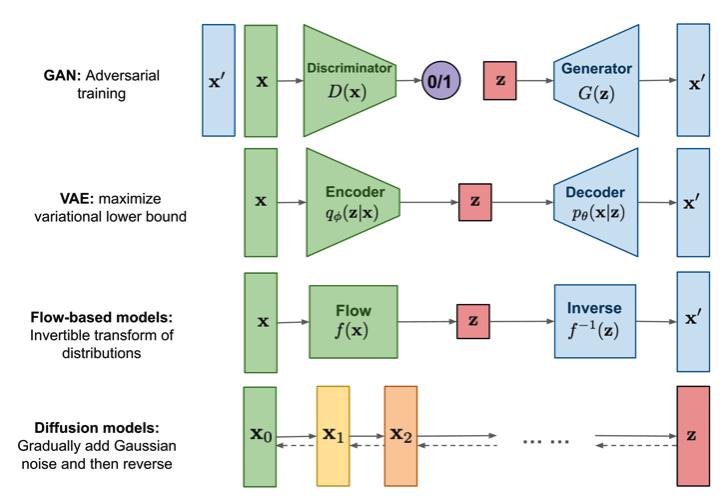

Source: https://lilianweng.github.io/posts/2021-07-11-diffusion-models/

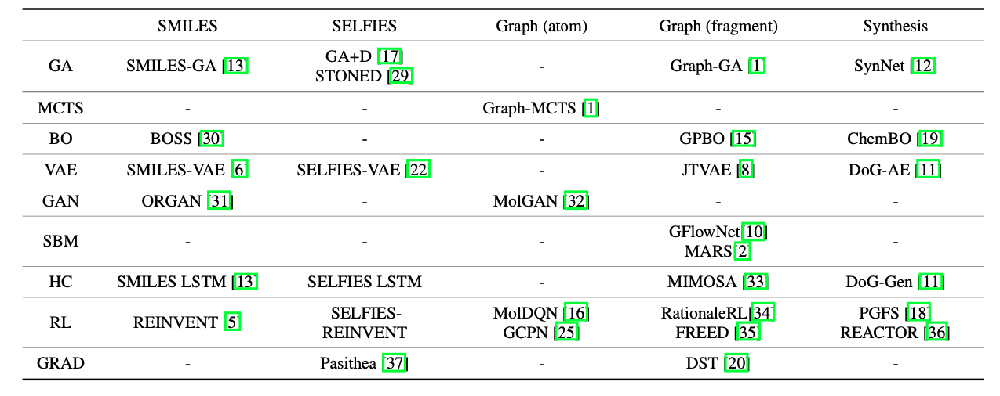

Source: Gao, Wenhao, et al. "Sample efficiency matters: a benchmark for practical molecular optimization." Advances in Neural Information Processing Systems 35 (2022): 21342-21357.

In previous lectuires and above, we focused on small organic molecules. Can those methods generalized to other modalities? Yes

A large portion of biomolecules can be represented by sequences, which are naturally combinatorial. All sequence based approaches, either machine learning ones or combinatorial optimization, could be applied to them smoothly.

One example is: Vaishnav, Eeshit Dhaval, et al. "The evolution, evolvability and engineering of gene regulatory DNA." Nature 603.7901 (2022): 455-463.

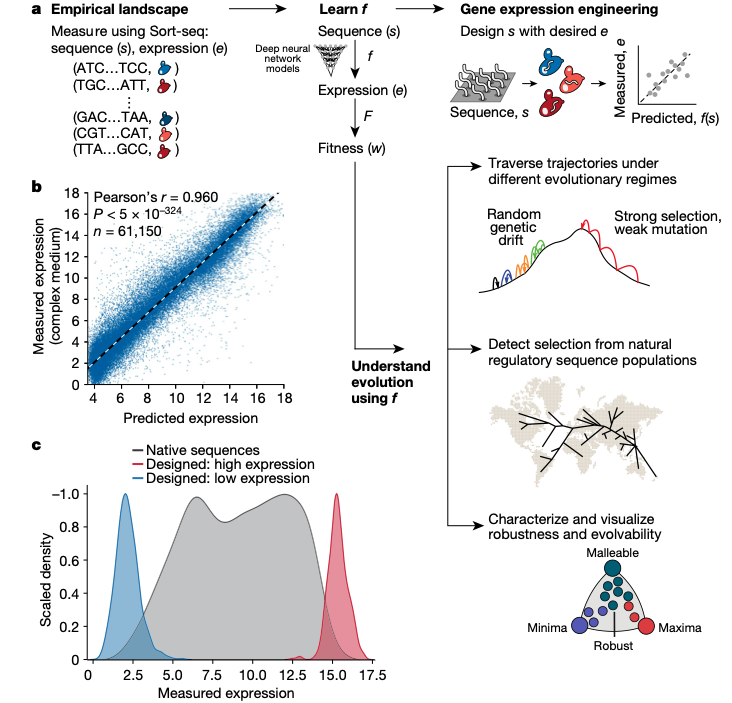

There is also a string representation for polymers: BigSMILES

Source: Schneider, Ludwig, et al. "Generative BigSMILES: an extension for polymer informatics, computer simulations & ML/AI." Digital Discovery (2024).

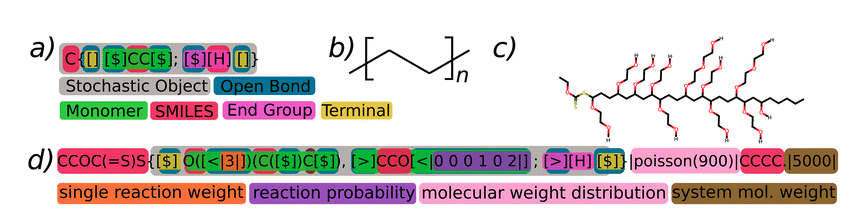

You can also construct graphs for polymer:

Source: Aldeghi, Matteo, and Connor W. Coley. "A graph representation of molecular ensembles for polymer property prediction." Chemical Science 13.35 (2022): 10486-10498.

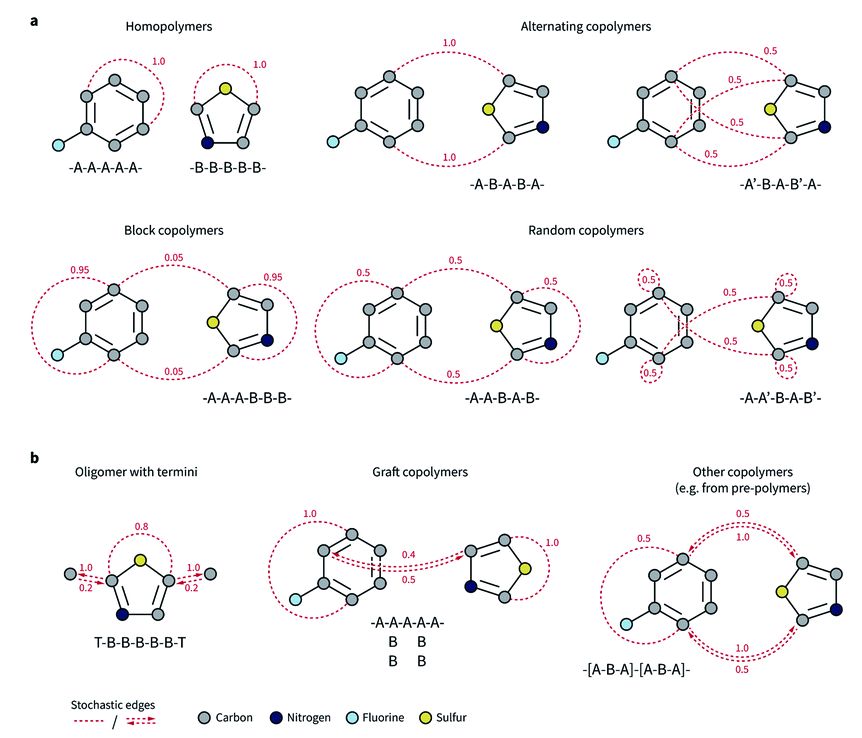

When there is a (or several) rigid structure(s), learning and generating 3D structures is an intuitive approach. Protein is such a case:

Such as Chroma (Ingraham, John B., et al. "Illuminating protein space with a programmable generative model." Nature (2023): 1-9.)

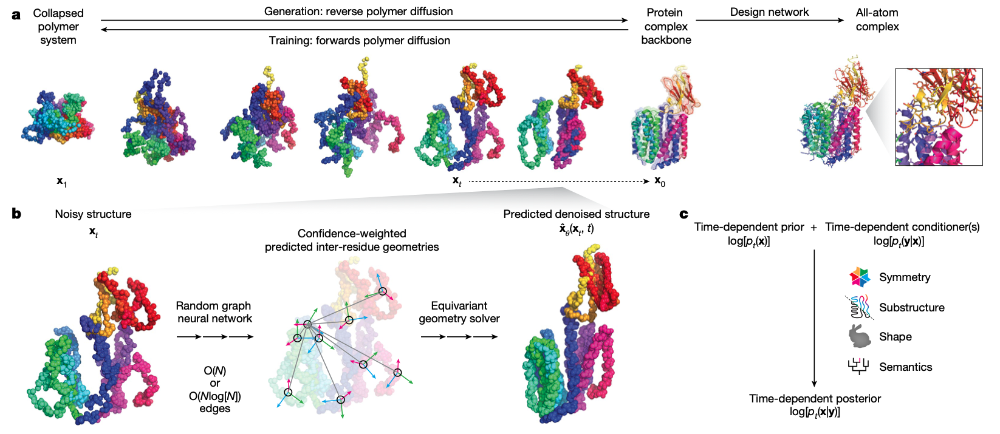

More specifically, antibody:

Source: Jin, Wengong, et al. "Iterative refinement graph neural network for antibody sequence-structure co-design." ICLR 2021.

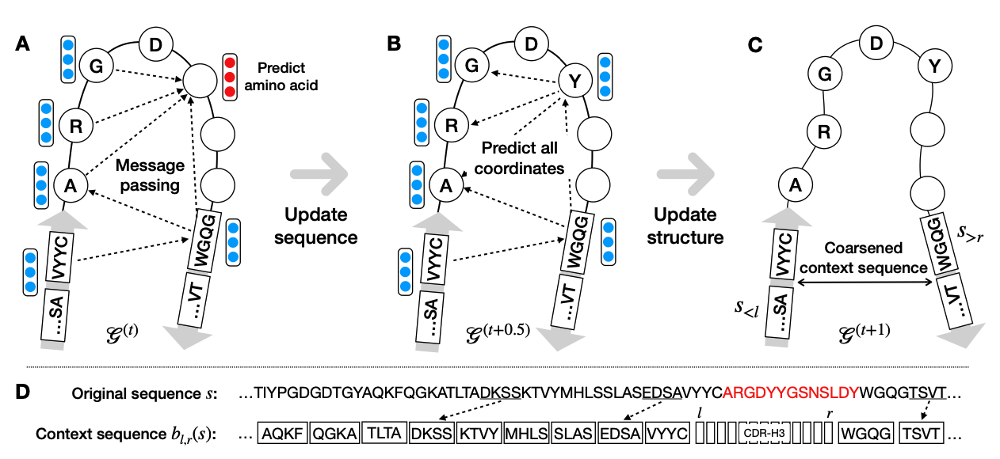

With (or without) periodic boundary condition, crystal structure of material can be learned and designed.

Source: CGCNN (Xie, Tian, and Jeffrey C. Grossman. "Crystal graph convolutional neural networks for an accurate and interpretable prediction of material properties." Physical review letters 120.14 (2018): 145301.)

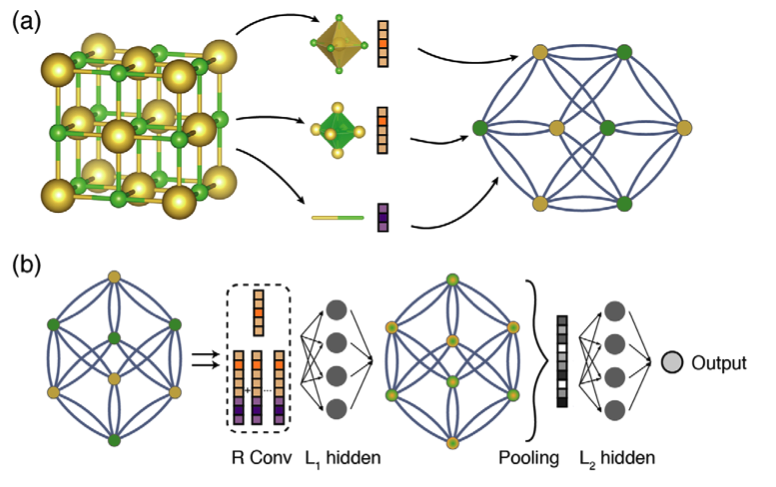

Source: MatterGen (Zeni, Claudio, et al. "MatterGen: a generative model for inorganic materials design." arXiv preprint arXiv:2312.03687 (2023).)

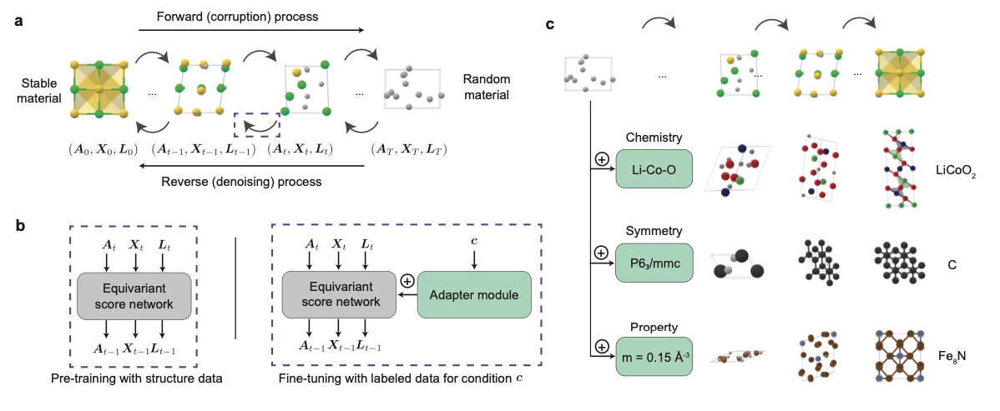

Source: DiffMOF (Fu, Xiang, et al. "MOFDiff: Coarse-grained Diffusion for Metal-Organic Framework Design." arXiv preprint arXiv:2310.10732 (2023).)
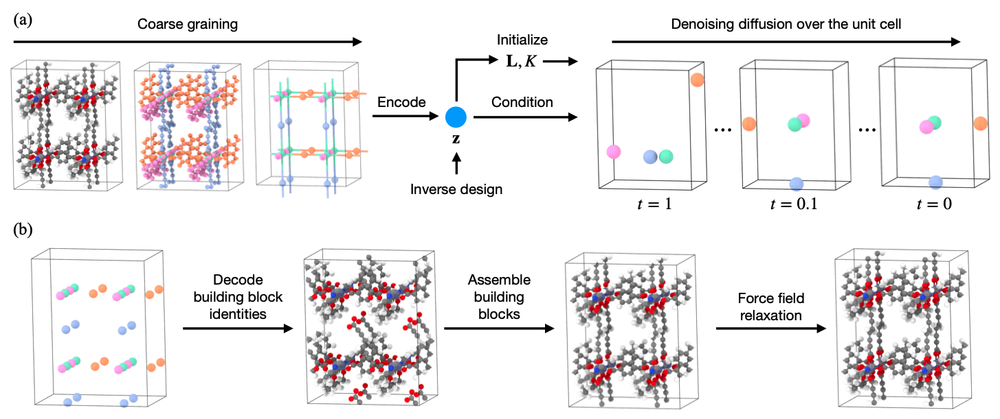


# **Practice**

Optional:
1.   Play with SMILES VAE, try to interpolate between two molecules.
2.   Try implement a Bayesian optimization loop with SMILES VAE (Hint: you can follow [this](https://github.com/wenhao-gao/mol_opt/blob/main/main/smiles_vae/run.py)).
3.   Pcik an oracle from [TDC](https://tdcommons.ai/functions/oracles/) and try optimize it with one of the algorithms you learned.

